### [Dataset citation]
##### <EyePACS dataset 2015>
- Emma Dugas, Jared, Jorge, Will Cukierski. (2015). Diabetic Retinopathy Detection. Kaggle. https://kaggle.com/competitions/diabetic-retinopathy-detection

##### <APTOS 2019>
- Karthik, Maggie, Sohier Dane. (2019). APTOS 2019 Blindness Detection. Kaggle. https://kaggle.com/competitions/aptos2019-blindness-detection

##### <INDIAN DIABETIC RETINOPATHY IMAGE DATASET (IDRID)>
- Prasanna Porwal, Samiksha Pachade, Ravi Kamble, Manesh Kokare, Girish Deshmukh, Vivek Sahasrabuddhe, Fabrice Meriaudeau, April 24, 2018, "Indian Diabetic Retinopathy Image Dataset (IDRiD)", IEEE Dataport, doi: https://dx.doi.org/10.21227/H25W98.
- https://www.kaggle.com/datasets/gami4388/diabetic-retinopathy-resized-train-15-19-dg?select=resized_train_15_19_DG

##### <Messidor 2>
- Abramoff et al, Automated analysis of retinal images for detection of referable diabetic retinopathy, JAMA Ophthalmol. 2013;131:351-7, and in Abramoff et al, Improved automated detection of diabetic retinopathy on a publicly available dataset through integration of deep learning, IOVS. 57:5200-06.
- https://medicine.uiowa.edu/eye/abramoff
- https://www.kaggle.com/datasets/mariaherrerot/messidor2preprocess/data

### [Package load]

In [1]:
import torch
print('pytorch version: {}'.format(torch.__version__))

pytorch version: 2.2.2


In [2]:
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import cv2
import glob
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
%matplotlib inline

print('pytorch version: {}'.format(torch.__version__))
print('GPU 사용 가능 여부: {}'.format(torch.cuda.is_available()))
device = "cuda" if torch.cuda.is_available() else "cpu"   # GPU 사용 가능 여부에 따라 device 정보 저장

'''
# TPU 사용법
pip install torch~=2.2.0 torch_xla[tpu]~=2.2.0 -f https://storage.googleapis.com/libtpu-releases/index.html
import torch_xla
import torch_xla.core.xla_model as xm
import torch_xla.distributed.xla_multiprocessing as xmp
device = xm.xla_device()


# Training에 xm.optimizer_step(optimizer, barrier=True)  # 이부분이 TPU 쓸때 필요한 코드!! 코드 추가
'''

pytorch version: 2.2.2
GPU 사용 가능 여부: False


'\n# TPU 사용법\npip install torch~=2.2.0 torch_xla[tpu]~=2.2.0 -f https://storage.googleapis.com/libtpu-releases/index.html\nimport torch_xla\nimport torch_xla.core.xla_model as xm\nimport torch_xla.distributed.xla_multiprocessing as xmp\ndevice = xm.xla_device()\n\n\n# Training에 xm.optimizer_step(optimizer, barrier=True)  # 이부분이 TPU 쓸때 필요한 코드!! 코드 추가\n'

In [3]:
# 이걸 해줘야 matplotlib 시행 시 에러가 안 남
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

### [For Colab]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from pathlib import Path

folder = "인공지능 공부" # 상위 directory
project_dir = "[Kaggle] Retinal OCT Images (optical coherence tomography)제목없는 폴더" # 폴더 이름
base_path = Path("/content/drive/MyDrive/")
project_path = base_path / folder / project_dir

os.chdir(project_path)
for x in list(project_path.glob("*")):
    if x.is_dir():
        dir_name = str(x.relative_to(project_path))
        os.rename(dir_name, dir_name.split(" ", 1)[0])
print(f"현재 디렉토리 위치: {os.getcwd()}")

### [Setting Hyperparameters]

In [4]:
batch_size = 64    # 큰 Image라 어쩔 수 없음
num_epochs = 60
learning_rate = 0.001   # 예비용

### [Dataset & DataLoader]

- Input size: (3, 1024, 1024)

In [11]:
data_dir = '../data/preprocessed_1024'

# For Kaggle notebook
#data_dir = '/kaggle/input/dr-dataset-eyepacs-aptos2019-idrid-messidor-2/preprocessed/'

In [33]:
os.path.basename(sorted(glob.glob(os.path.join(data_dir, str('test'), '*')))[1]).split('.')[0]
# -> patient ID

'01b3aed3ed4c'

In [8]:
csv = pd.read_csv(os.path.join(data_dir,str('test_label'+'.csv')), index_col=0)
csv

,diagnosis
20051020_45050_0100_PP,3
20051020_45068_0100_PP,3
20051020_53062_0100_PP,3
20051020_53178_0100_PP,3
20051020_54209_0100_PP,3
...,...
f8fc411092c7,2
f920ccd926db,2
fac399455195,2
fba493e17448,2


In [34]:
class DRDataset(Dataset):
    def __init__(self, data_dir, mode, csv, transform=None):
        self.all_data = sorted(glob.glob(os.path.join(data_dir, mode,'*')))
        self.mode = mode
        self.transform = transform
        self.csv = csv
    
    def __getitem__(self, index):
        data_path = self.all_data[index]
        img = Image.open(data_path)
        if self.transform is not None:
            img = self.transform(img)
        img = img.squeeze()
        pt_id = os.path.basename(data_path).split('.')[0]
        label = int(self.csv.loc[pt_id, 'diagnosis'])
        return img, label
    
    def __len__(self):
        length = len(self.all_data)
        return length

In [47]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomRotation(180),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomChoice([
            transforms.RandomAdjustSharpness(0),
            transforms.RandomAdjustSharpness(1),
            transforms.RandomAdjustSharpness(2),
            transforms.RandomAdjustSharpness(3),
            ]),
        transforms.RandomPosterize(7, p=0.2),
        transforms.RandomResizedCrop(1024, scale=(0.96, 1.0), ratio=(0.95, 1.05)),
        transforms.ToTensor()
    ]),
    'val': transforms.Compose([
        transforms.ToTensor()
        ]),
    'test': transforms.Compose([
        transforms.ToTensor()
        ])
}

In [36]:
train_csv = pd.read_csv(os.path.join(data_dir,'train_label.csv'), index_col=0)
val_csv = pd.read_csv(os.path.join(data_dir,'val_label.csv'), index_col=0)
test_csv = pd.read_csv(os.path.join(data_dir,'test_label.csv'), index_col=0)

In [37]:
train_csv['diagnosis'].value_counts(sort=False)

diagnosis
4    2871
3    2988
1    4093
0    9050
2    8437
Name: count, dtype: int64

array([[<Axes: title={'center': 'diagnosis'}>]], dtype=object)

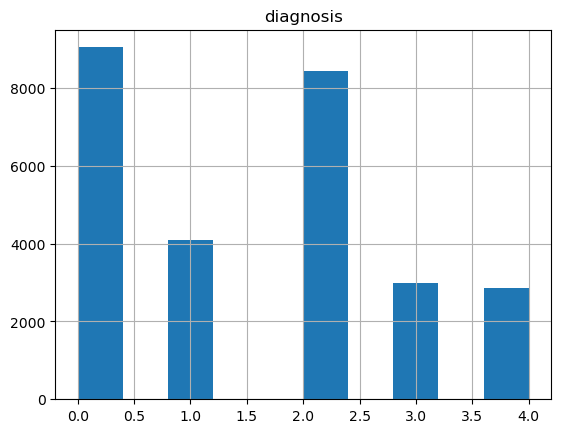

In [38]:
train_csv.hist(column='diagnosis')

In [39]:
val_csv['diagnosis'].value_counts(sort=False)

diagnosis
4     624
3     670
1    1353
2    2905
0    2935
Name: count, dtype: int64

array([[<Axes: title={'center': 'diagnosis'}>]], dtype=object)

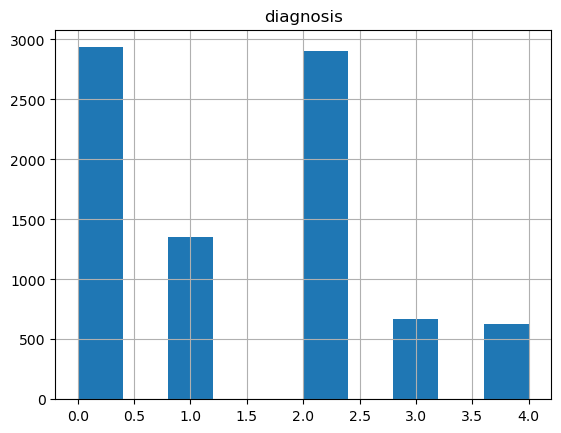

In [40]:
val_csv.hist(column='diagnosis')

In [41]:
test_csv['diagnosis'].value_counts(sort=False)

diagnosis
3     667
4     627
0    2937
1    1341
2    2915
Name: count, dtype: int64

array([[<Axes: title={'center': 'diagnosis'}>]], dtype=object)

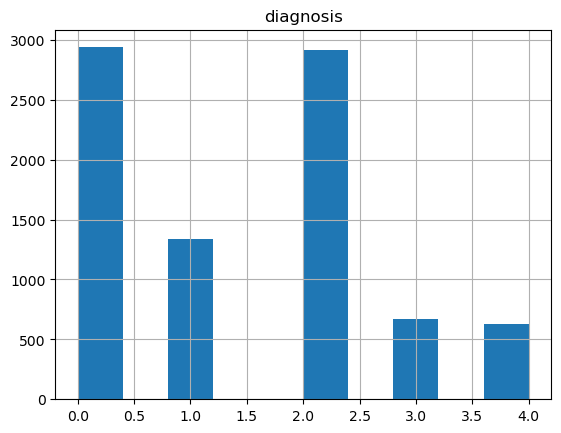

In [42]:
test_csv.hist(column='diagnosis')

In [45]:
train_data = DRDataset(data_dir=data_dir, mode='train', csv=train_csv, transform=data_transforms['train'])
val_data = DRDataset(data_dir=data_dir, mode='val', csv=val_csv, transform=data_transforms['val'])
test_data = DRDataset(data_dir=data_dir, mode='test', csv=test_csv, transform=data_transforms['test'])

train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=False)
val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False, drop_last=False)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, drop_last=False)
# DataLoader worker (pid(s) ) exited unexpectedly 뜨면 num worker 없애주기

# For Kaggle: 2 core CPU available
#train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=False, num_workers=2)  # num_worker로 Multi Process Data Loading 구현
#val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=2) # Kaggle CPU = 2 core
#test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=2)

In [46]:
np.array(next(iter(train_loader))[0]).shape

(32, 3, 1024, 1024)

- Input size: (3, 512, 512)

In [5]:
data_dir = '../data/preprocessed_512'

# For Kaggle notebook
#data_dir = ''

In [5]:
os.path.basename(sorted(glob.glob(os.path.join(data_dir, str('test'), '*')))[1]).split('.')[0]
# -> patient ID

'01b3aed3ed4c'

In [6]:
csv = pd.read_csv(os.path.join(data_dir,str('test_label'+'.csv')), index_col=0)
csv

,diagnosis
20051020_45050_0100_PP,3
20051020_54209_0100_PP,3
20051020_57761_0100_PP,3
20051216_45226_0200_PP,3
20051216_47000_0200_PP,3
...,...
f8372e80f731,2
fc4c2d35c6f8,2
fc4d69128e7c,2
ffa47f6a7bf4,2


In [6]:
class DRDataset(Dataset):
    def __init__(self, data_dir, mode, csv, transform=None):
        self.all_data = sorted(glob.glob(os.path.join(data_dir, mode,'*')))
        self.mode = mode
        self.transform = transform
        self.csv = csv
    
    def __getitem__(self, index):
        data_path = self.all_data[index]
        img = Image.open(data_path)
        if self.transform is not None:
            img = self.transform(img)
        img = img.squeeze()
        pt_id = os.path.basename(data_path).split('.')[0]
        label = int(self.csv.loc[pt_id, 'diagnosis'])
        return img, label
    
    def __len__(self):
        length = len(self.all_data)
        return length

In [7]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomRotation(180),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomChoice([
            transforms.RandomAdjustSharpness(0),
            transforms.RandomAdjustSharpness(1),
            transforms.RandomAdjustSharpness(2),
            transforms.RandomAdjustSharpness(3),
            ]),
        transforms.RandomPosterize(7, p=0.2),
        transforms.RandomResizedCrop(512, scale=(0.96, 1.0), ratio=(0.95, 1.05)),
        transforms.ToTensor()
    ]),
    'val': transforms.Compose([
        transforms.ToTensor()
        ]),
    'test': transforms.Compose([
        transforms.ToTensor()
        ])
}

In [8]:
train_csv = pd.read_csv(os.path.join(data_dir,'train_label.csv'), index_col=0)
val_csv = pd.read_csv(os.path.join(data_dir,'val_label.csv'), index_col=0)
test_csv = pd.read_csv(os.path.join(data_dir,'test_label.csv'), index_col=0)

In [23]:
train_csv['diagnosis'].value_counts(sort=False)

diagnosis
4    2871
3    2988
1    4093
0    9050
2    8437
Name: count, dtype: int64

array([[<Axes: title={'center': 'diagnosis'}>]], dtype=object)

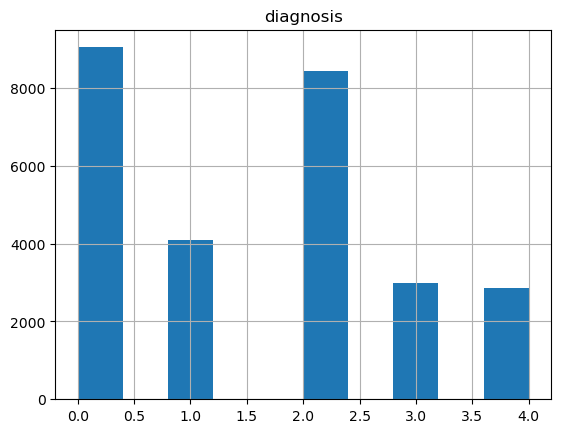

In [11]:
train_csv.hist(column='diagnosis')

In [12]:
val_csv['diagnosis'].value_counts(sort=False)

diagnosis
4     624
3     670
1    1353
2    2905
0    2935
Name: count, dtype: int64

array([[<Axes: title={'center': 'diagnosis'}>]], dtype=object)

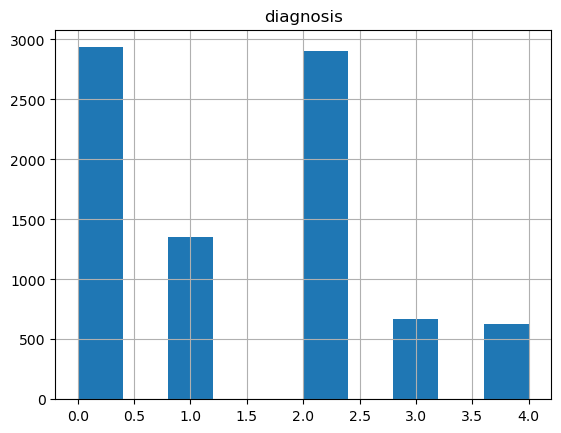

In [13]:
val_csv.hist(column='diagnosis')

In [14]:
test_csv['diagnosis'].value_counts(sort=False)

diagnosis
3     667
4     627
0    2937
1    1341
2    2915
Name: count, dtype: int64

array([[<Axes: title={'center': 'diagnosis'}>]], dtype=object)

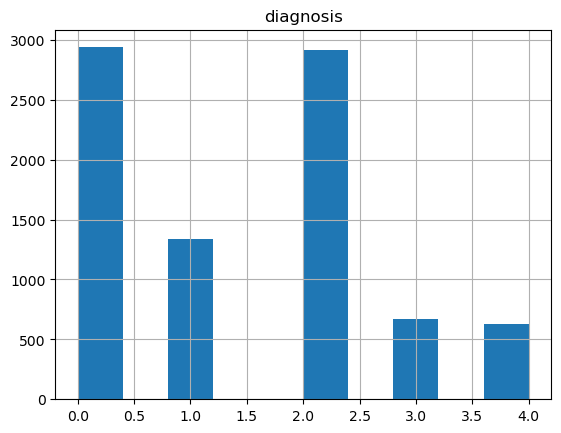

In [15]:
test_csv.hist(column='diagnosis')

In [19]:
train_data = DRDataset(data_dir=data_dir, mode='train', csv=train_csv, transform=data_transforms['train'])
val_data = DRDataset(data_dir=data_dir, mode='val', csv=val_csv, transform=data_transforms['val'])
test_data = DRDataset(data_dir=data_dir, mode='test', csv=test_csv, transform=data_transforms['test'])

train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=False)
val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False, drop_last=False)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, drop_last=False)
# DataLoader worker (pid(s) ) exited unexpectedly 뜨면 num worker 없애주기

# For Kaggle: 2 core CPU available
#train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=False, num_workers=2)  # num_worker로 Multi Process Data Loading 구현
#val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=2) # Kaggle CPU = 2 core
#test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=2)

In [25]:
np.array(next(iter(train_loader))[0]).shape

(64, 3, 512, 512)

### [Model: ResNet50 Transfer Learning]

- Input: (3, 1024, 1024)

In [48]:
class TransferResNet1024(nn.Module):
    def __init__ (self, num_classes):
        super(TransferResNet1024, self).__init__()
        self.ResNet50 = torchvision.models.resnet50(pretrained=True)
        self.ResNet50.avgpool = nn.MaxPool2d(4)
        self.ResNet50.fc = nn.Linear(2048*8*8, num_classes)
    
    def forward(self,x):
        x = self.ResNet50(x)
        return x

In [49]:
resnet50_transfer = TransferResNet1024(num_classes=5).to(device) 

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [30]:
resnet50_transfer

TransferResNet(
  (ResNet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
  

In [31]:
from torchsummary import summary
summary(resnet50_transfer, (3, 1024, 1024))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 512, 512]           9,408
       BatchNorm2d-2         [-1, 64, 512, 512]             128
              ReLU-3         [-1, 64, 512, 512]               0
         MaxPool2d-4         [-1, 64, 256, 256]               0
            Conv2d-5         [-1, 64, 256, 256]           4,096
       BatchNorm2d-6         [-1, 64, 256, 256]             128
              ReLU-7         [-1, 64, 256, 256]               0
            Conv2d-8         [-1, 64, 256, 256]          36,864
       BatchNorm2d-9         [-1, 64, 256, 256]             128
             ReLU-10         [-1, 64, 256, 256]               0
           Conv2d-11        [-1, 256, 256, 256]          16,384
      BatchNorm2d-12        [-1, 256, 256, 256]             512
           Conv2d-13        [-1, 256, 256, 256]          16,384
      BatchNorm2d-14        [-1, 256, 2

In [35]:
from torchinfo import summary
summary(resnet50_transfer, input_size=(16, 3, 1024, 1024), col_width=20, depth=100, row_settings=["depth", "var_names"], col_names=["input_size", "kernel_size", "output_size", "params_percent"])

Layer (type (var_name):depth-idx)                       Input Shape          Kernel Shape         Output Shape         Param %
TransferResNet (TransferResNet)                         [16, 3, 1024, 1024]  --                   [16, 5]                   --
├─ResNet (ResNet50): 1-1                                [16, 3, 1024, 1024]  --                   [16, 5]                   --
│    └─Conv2d (conv1): 2-1                              [16, 3, 1024, 1024]  [7, 7]               [16, 64, 512, 512]     0.04%
│    └─BatchNorm2d (bn1): 2-2                           [16, 64, 512, 512]   --                   [16, 64, 512, 512]     0.00%
│    └─ReLU (relu): 2-3                                 [16, 64, 512, 512]   --                   [16, 64, 512, 512]        --
│    └─MaxPool2d (maxpool): 2-4                         [16, 64, 512, 512]   3                    [16, 64, 256, 256]        --
│    └─Sequential (layer1): 2-5                         [16, 64, 256, 256]   --                   [16, 256, 256

- Input: (3, 512, 512)

In [5]:
class TransferResNet512(nn.Module):
    def __init__ (self, num_classes):
        super(TransferResNet512, self).__init__()
        self.ResNet50 = torchvision.models.resnet50(pretrained=True)
        self.ResNet50.avgpool = nn.MaxPool2d(2)
        self.ResNet50.fc = nn.Linear(2048*8*8, num_classes)
    
    def forward(self,x):
        x = self.ResNet50(x)
        return x

In [6]:
resnet50_transfer = TransferResNet512(num_classes=5).to(device) 

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [33]:
resnet50_transfer

TransferResNet512(
  (ResNet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(

In [29]:
from torchsummary import summary
summary(resnet50_transfer, (3, 512, 512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           9,408
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
         MaxPool2d-4         [-1, 64, 128, 128]               0
            Conv2d-5         [-1, 64, 128, 128]           4,096
       BatchNorm2d-6         [-1, 64, 128, 128]             128
              ReLU-7         [-1, 64, 128, 128]               0
            Conv2d-8         [-1, 64, 128, 128]          36,864
       BatchNorm2d-9         [-1, 64, 128, 128]             128
             ReLU-10         [-1, 64, 128, 128]               0
           Conv2d-11        [-1, 256, 128, 128]          16,384
      BatchNorm2d-12        [-1, 256, 128, 128]             512
           Conv2d-13        [-1, 256, 128, 128]          16,384
      BatchNorm2d-14        [-1, 256, 1

In [30]:
from torchinfo import summary
summary(resnet50_transfer, input_size=(64, 3, 512, 512), col_width=20, depth=100, row_settings=["depth", "var_names"], col_names=["input_size", "kernel_size", "output_size", "params_percent"])

Layer (type (var_name):depth-idx)                       Input Shape          Kernel Shape         Output Shape         Param %
TransferResNet (TransferResNet)                         [64, 3, 512, 512]    --                   [64, 5]                   --
├─ResNet (ResNet50): 1-1                                [64, 3, 512, 512]    --                   [64, 5]                   --
│    └─Conv2d (conv1): 2-1                              [64, 3, 512, 512]    [7, 7]               [64, 64, 256, 256]     0.04%
│    └─BatchNorm2d (bn1): 2-2                           [64, 64, 256, 256]   --                   [64, 64, 256, 256]     0.00%
│    └─ReLU (relu): 2-3                                 [64, 64, 256, 256]   --                   [64, 64, 256, 256]        --
│    └─MaxPool2d (maxpool): 2-4                         [64, 64, 256, 256]   3                    [64, 64, 128, 128]        --
│    └─Sequential (layer1): 2-5                         [64, 64, 128, 128]   --                   [64, 256, 128

In [36]:
count = 0
for name, param in resnet50_transfer.named_parameters():
    count += 1
    print(f"count:{count},",name, param.requires_grad)

count:1, ResNet50.conv1.weight True
count:2, ResNet50.bn1.weight True
count:3, ResNet50.bn1.bias True
count:4, ResNet50.layer1.0.conv1.weight True
count:5, ResNet50.layer1.0.bn1.weight True
count:6, ResNet50.layer1.0.bn1.bias True
count:7, ResNet50.layer1.0.conv2.weight True
count:8, ResNet50.layer1.0.bn2.weight True
count:9, ResNet50.layer1.0.bn2.bias True
count:10, ResNet50.layer1.0.conv3.weight True
count:11, ResNet50.layer1.0.bn3.weight True
count:12, ResNet50.layer1.0.bn3.bias True
count:13, ResNet50.layer1.0.downsample.0.weight True
count:14, ResNet50.layer1.0.downsample.1.weight True
count:15, ResNet50.layer1.0.downsample.1.bias True
count:16, ResNet50.layer1.1.conv1.weight True
count:17, ResNet50.layer1.1.bn1.weight True
count:18, ResNet50.layer1.1.bn1.bias True
count:19, ResNet50.layer1.1.conv2.weight True
count:20, ResNet50.layer1.1.bn2.weight True
count:21, ResNet50.layer1.1.bn2.bias True
count:22, ResNet50.layer1.1.conv3.weight True
count:23, ResNet50.layer1.1.bn3.weight Tr

- https://89douner.tistory.com/289

In [50]:
# Layer 2, 3, 4의 required_grad True로 바꾸기 (Layer 2의 시작: 34) -> 34 이전은 false, 이후는 True
count = 0
for param in resnet50_transfer.ResNet50.parameters():
    count += 1
    if count >= 34:
        param.requires_grad = True
    else:
        param.requires_grad = False

for name, param in resnet50_transfer.named_parameters():
    print(name, param.requires_grad)

ResNet50.conv1.weight False
ResNet50.bn1.weight False
ResNet50.bn1.bias False
ResNet50.layer1.0.conv1.weight False
ResNet50.layer1.0.bn1.weight False
ResNet50.layer1.0.bn1.bias False
ResNet50.layer1.0.conv2.weight False
ResNet50.layer1.0.bn2.weight False
ResNet50.layer1.0.bn2.bias False
ResNet50.layer1.0.conv3.weight False
ResNet50.layer1.0.bn3.weight False
ResNet50.layer1.0.bn3.bias False
ResNet50.layer1.0.downsample.0.weight False
ResNet50.layer1.0.downsample.1.weight False
ResNet50.layer1.0.downsample.1.bias False
ResNet50.layer1.1.conv1.weight False
ResNet50.layer1.1.bn1.weight False
ResNet50.layer1.1.bn1.bias False
ResNet50.layer1.1.conv2.weight False
ResNet50.layer1.1.bn2.weight False
ResNet50.layer1.1.bn2.bias False
ResNet50.layer1.1.conv3.weight False
ResNet50.layer1.1.bn3.weight False
ResNet50.layer1.1.bn3.bias False
ResNet50.layer1.2.conv1.weight False
ResNet50.layer1.2.bn1.weight False
ResNet50.layer1.2.bn1.bias False
ResNet50.layer1.2.conv2.weight False
ResNet50.layer1.2.bn

In [51]:
# Layer 3, 4의 Conv layer를 다시 initialization
for name, layer in resnet50_transfer.ResNet50.named_children():
    if name == 'layer2':
        bottleneck_index = 0
        conv_index = 1
        for name, param in resnet50_transfer.ResNet50.named_parameters():
            # Layer 3의 Conv layer parameter initialization
            if name == 'layer2.'+str(bottleneck_index)+'.conv'+str(conv_index)+'.weight':
                print('layer2의 '+str(bottleneck_index)+'번째 bottleneck의 conv'+str(conv_index)+'.weight')
                nn.init.xavier_uniform_(param)
                print(name+'의 conv filter initialization setting 완료')
                print()
                conv_index += 1
                if name == 'layer2.'+str(bottleneck_index)+'.conv3.weight':
                    bottleneck_index += 1
                    conv_index = 1
    elif name == 'layer3':
        bottleneck_index = 0
        conv_index = 1
        for name, param in resnet50_transfer.ResNet50.named_parameters():
            # Layer 3의 Conv layer parameter initialization
            if name == 'layer3.'+str(bottleneck_index)+'.conv'+str(conv_index)+'.weight':
                print('layer3의 '+str(bottleneck_index)+'번째 bottleneck의 conv'+str(conv_index)+'.weight')
                nn.init.xavier_uniform_(param)
                print(name+'의 conv filter initialization setting 완료')
                print()
                conv_index += 1
                if name == 'layer3.'+str(bottleneck_index)+'.conv3.weight':
                    bottleneck_index += 1
                    conv_index = 1
    elif name == 'layer4':
        bottleneck_index = 0
        conv_index = 1
        for name, param in resnet50_transfer.ResNet50.named_parameters():
            # Layer 4의 Conv layer parameter initialization
            if name == 'layer4.'+str(bottleneck_index)+'.conv'+str(conv_index)+'.weight':
                print('layer4의 '+str(bottleneck_index)+'번째 bottleneck의 conv'+str(conv_index)+'.weight')
                nn.init.xavier_uniform_(param)
                print(name+'의 conv filter initialization setting 완료')
                print()
                conv_index += 1
                if name == 'layer4.'+str(bottleneck_index)+'.conv3.weight':
                    bottleneck_index += 1
                    conv_index = 1

layer2의 0번째 bottleneck의 conv1.weight
layer2.0.conv1.weight의 conv filter initialization setting 완료

layer2의 0번째 bottleneck의 conv2.weight
layer2.0.conv2.weight의 conv filter initialization setting 완료

layer2의 0번째 bottleneck의 conv3.weight
layer2.0.conv3.weight의 conv filter initialization setting 완료

layer2의 1번째 bottleneck의 conv1.weight
layer2.1.conv1.weight의 conv filter initialization setting 완료

layer2의 1번째 bottleneck의 conv2.weight
layer2.1.conv2.weight의 conv filter initialization setting 완료

layer2의 1번째 bottleneck의 conv3.weight
layer2.1.conv3.weight의 conv filter initialization setting 완료

layer2의 2번째 bottleneck의 conv1.weight
layer2.2.conv1.weight의 conv filter initialization setting 완료

layer2의 2번째 bottleneck의 conv2.weight
layer2.2.conv2.weight의 conv filter initialization setting 완료

layer2의 2번째 bottleneck의 conv3.weight
layer2.2.conv3.weight의 conv filter initialization setting 완료

layer2의 3번째 bottleneck의 conv1.weight
layer2.3.conv1.weight의 conv filter initialization setting 완료

layer2의 3번

In [52]:
# Layer 2, 3, 4의 batch normalization gamma, beta initialization
# 전부 initialization시키므로 처음 시작을 0, 1로 시작, 만약 좀 더 뒤로 바꾸고 싶으면 초기 시작 값을 바꾸기
bottleneck_index = 0
bn_index = 1
for name, param in resnet50_transfer.ResNet50.named_parameters():          
    if name == 'layer2.'+str(bottleneck_index)+'.'+'bn1.weight':
        print('layer2의 '+str(bottleneck_index)+'번째 bottleneck의 '+'bn1.weight')
        nn.init.ones_(param)
        print(name+'의 gamma one setting 완료')
        print()
    elif name == 'layer2.'+str(bottleneck_index)+'.'+'bn2.weight':
        print('layer2의 '+str(bottleneck_index)+'번째 bottleneck의 '+'bn2.weight')
        nn.init.ones_(param)
        print(name+'의 gamma one setting 완료')
        print()
    elif name == 'layer2.'+str(bottleneck_index)+'.'+'bn3.weight':
        print('layer2의 '+str(bottleneck_index)+'번째 bottleneck의 '+'bn3.weight')
        nn.init.zeros_(param)
        print(name+'의 gamma zero setting 완료')    # residual block 마지막의 batchnorm의 gamma는 0으로, 나머지는 1로 초기화시킨다고 함
        print()
    elif name == 'layer2.'+str(bottleneck_index)+'.'+'bn'+str(bn_index)+'.bias':
        print('layer2.'+str(bottleneck_index)+'.'+'bn'+str(bn_index)+'.bias')     # bias는 0으로 초기화
        nn.init.zeros_(param)
        bn_index += 1
        print(name+'의 beta zero setting 완료')
        if bn_index == 4:
            bn_index=1
            bottleneck_index += 1
        print()

bottleneck_index = 0
bn_index = 1
for name, param in resnet50_transfer.ResNet50.named_parameters():          
    if name == 'layer3.'+str(bottleneck_index)+'.'+'bn1.weight':
        print('layer3의 '+str(bottleneck_index)+'번째 bottleneck의 '+'bn1.weight')
        nn.init.ones_(param)
        print(name+'의 gamma one setting 완료')
        print()
    elif name == 'layer3.'+str(bottleneck_index)+'.'+'bn2.weight':
        print('layer3의 '+str(bottleneck_index)+'번째 bottleneck의 '+'bn2.weight')
        nn.init.ones_(param)
        print(name+'의 gamma one setting 완료')
        print()
    elif name == 'layer3.'+str(bottleneck_index)+'.'+'bn3.weight':
        print('layer3의 '+str(bottleneck_index)+'번째 bottleneck의 '+'bn3.weight')
        nn.init.zeros_(param)
        print(name+'의 gamma zero setting 완료')    # residual block 마지막의 batchnorm의 gamma는 0으로, 나머지는 1로 초기화시킨다고 함
        print()
    elif name == 'layer3.'+str(bottleneck_index)+'.'+'bn'+str(bn_index)+'.bias':
        print('layer3.'+str(bottleneck_index)+'.'+'bn'+str(bn_index)+'.bias')     # bias는 0으로 초기화
        nn.init.zeros_(param)
        bn_index += 1
        print(name+'의 beta zero setting 완료')
        if bn_index == 4:
            bn_index=1
            bottleneck_index += 1
        print()

bottleneck_index = 0
bn_index = 1
for name, param in resnet50_transfer.ResNet50.named_parameters():          
    if name == 'layer4.'+str(bottleneck_index)+'.'+'bn1.weight':
        print('layer4의 '+str(bottleneck_index)+'번째 bottleneck의 '+'bn1.weight')
        nn.init.ones_(param)
        print(name+'의 gamma one setting 완료')
        print()
    elif name == 'layer4.'+str(bottleneck_index)+'.'+'bn2.weight':
        print('layer4의 '+str(bottleneck_index)+'번째 bottleneck의 '+'bn2.weight')
        nn.init.ones_(param)
        print(name+'의 gamma one setting 완료')
        print()
    elif name == 'layer4.'+str(bottleneck_index)+'.'+'bn3.weight':
        print('layer4의 '+str(bottleneck_index)+'번째 bottleneck의 '+'bn3.weight')
        nn.init.zeros_(param)
        print(name+'의 gamma zero setting 완료')    # residual block 마지막의 batchnorm의 gamma는 0으로, 나머지는 1로 초기화시킨다고 함
        print()
    elif name == 'layer4.'+str(bottleneck_index)+'.'+'bn'+str(bn_index)+'.bias':
        print('layer4.'+str(bottleneck_index)+'.'+'bn'+str(bn_index)+'.bias')     # bias는 0으로 초기화
        nn.init.zeros_(param)
        bn_index += 1
        print(name+'의 beta zero setting 완료')
        if bn_index == 4:
            bn_index=1
            bottleneck_index += 1
        print()

layer2의 0번째 bottleneck의 bn1.weight
layer2.0.bn1.weight의 gamma one setting 완료

layer2.0.bn1.bias
layer2.0.bn1.bias의 beta zero setting 완료

layer2의 0번째 bottleneck의 bn2.weight
layer2.0.bn2.weight의 gamma one setting 완료

layer2.0.bn2.bias
layer2.0.bn2.bias의 beta zero setting 완료

layer2의 0번째 bottleneck의 bn3.weight
layer2.0.bn3.weight의 gamma zero setting 완료

layer2.0.bn3.bias
layer2.0.bn3.bias의 beta zero setting 완료

layer2의 1번째 bottleneck의 bn1.weight
layer2.1.bn1.weight의 gamma one setting 완료

layer2.1.bn1.bias
layer2.1.bn1.bias의 beta zero setting 완료

layer2의 1번째 bottleneck의 bn2.weight
layer2.1.bn2.weight의 gamma one setting 완료

layer2.1.bn2.bias
layer2.1.bn2.bias의 beta zero setting 완료

layer2의 1번째 bottleneck의 bn3.weight
layer2.1.bn3.weight의 gamma zero setting 완료

layer2.1.bn3.bias
layer2.1.bn3.bias의 beta zero setting 완료

layer2의 2번째 bottleneck의 bn1.weight
layer2.2.bn1.weight의 gamma one setting 완료

layer2.2.bn1.bias
layer2.2.bn1.bias의 beta zero setting 완료

layer2의 2번째 bottleneck의 bn2.weight
laye

In [ ]:
# Kaggle의 MultiGPU (2개) 사용할 경우 사용
resnet50_transfer = torch.nn.DataParallel(resnet50_transfer, device_ids = [0,1]).to(device)

### [Saving checkpoints]

In [ ]:
def save_model(model, epoch, optimizer, epoch_loss, val_accuracy, saved_dir):
    os.makedirs(saved_dir, exist_ok=True)
    check_point = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': epoch_loss
    }
    val_accuracy = round(val_accuracy,1)
    file_name = str(f"ckpoint_{epoch+1}_{val_accuracy}%.pt")
    output_path = os.path.join(saved_dir, file_name)
    torch.save(check_point,output_path)

### [Loss tracker]

##### Tensorboard

In [ ]:
logs_base_dir = "./logs/logs_transfer"
os.makedirs(logs_base_dir, exist_ok=True)

from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter(logs_base_dir)

### [Defining Train, Val, Test Function]

In [ ]:
def train(num_epochs, model, data_loader, criterion, optimizer, scheduler, val_every, device, saved_dir, writer):
    print('Start training..')
    best_loss = 9999999
    best_epoch = 0
    count = 0
    for epoch in tqdm(range(num_epochs), desc='epoch'):
        torch.cuda.empty_cache()
        # running_loss = 0.0
        for i, (imgs, labels) in tqdm(enumerate(data_loader), desc="in epoch"):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            loss = criterion(outputs, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            #xm.optimizer_step(optimizer, barrier=True) # TPU인 경우 사용

            _, argmax = torch.max(outputs, 1)
            accuracy = (labels == argmax).float().mean()

            if (i+1) % 30 == 0:
                print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}, Accuracy: {:.2f}%'.format(
                    epoch+1, num_epochs, i+1, len(data_loader), loss.item(), accuracy.item() * 100))
            if (i+1) % 50 == 0:
                writer.add_scalar('Loss/Train', loss, i)
                writer.add_scalar('Accuracy/Train', accuracy, i)
            #if i % 30 == 29:
                #loss_tracker(loss_plt, torch.Tensor([running_loss/30]), torch.Tensor([i + epoch*len(trainloader) ]))
                #running_loss = 0.0
        if (epoch + 1) % val_every == 0:
            avrg_loss, val_accuracy = validation(epoch + 1, model, val_loader, criterion, device)
            # Saving validation loss and accuracy
            writer.add_scalar('Loss/Validation', avrg_loss, epoch+1)
            writer.add_scalar('Accuracy/Validation', val_accuracy, epoch+1)
            if avrg_loss < best_loss:
                print(f'Best performance at epoch: {epoch + 1}')
                best_loss = round(float(avrg_loss),5)
                if val_accuracy >= 60:
                    save_model(model, epoch, optimizer, avrg_loss, val_accuracy, saved_dir)
                    print('Save model in', saved_dir)
                else:
                    print('The model is not saved because the accuracy does not exceed 60%.')
                count = 0
                best_epoch = epoch + 1
            else:
                count += 1
                print(f'Best epoch does not appear / Previous best epoch:{best_epoch}, best loss: {best_loss}')
                print(f'A number of epochs remain until early stop: {20-count}')
                if count >= 20:
                    print('Best performance does not occur within 20 epochs. Early stopping!!')
                    scheduler.step()
                    writer.flush()
                    return
            ''' Only for local setting
            loss_tracker(loss_plt, torch.Tensor([avrg_loss]), torch.Tensor([epoch]))'''
        scheduler.step()
    writer.flush()

In [ ]:
def validation(epoch, model, data_loader, criterion, device):
    print('Start validation #{}'.format(epoch) )
    torch.cuda.empty_cache()
    model.eval()
    with torch.no_grad():
        total = 0
        correct = 0
        total_loss = 0
        cnt = 0
        for i, (imgs, labels) in enumerate(data_loader):
            imgs, labels = imgs.to(device), labels.to(device)

            outputs = model(imgs)
            loss = criterion(outputs,labels)
            
            total += imgs.size(0)
            _, argmax = torch.max(outputs, 1)
            correct += (labels == argmax).sum().item()
            total_loss += loss
            cnt += 1
        avrg_loss = total_loss / cnt
        val_accuracy = correct / total * 100
        print('Validation #{}  Accuracy: {:.2f}%  Average Loss: {:.4f}'.format(epoch, val_accuracy, avrg_loss))
    model.train()
    return float(avrg_loss), float(val_accuracy)

In [10]:
def test(model, data_loader, device):
    print('Start test..')
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        answer_list = []
        pred_list = []
        pred_proba_list = []
        
        for i, (imgs, labels) in tqdm(enumerate(data_loader)):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)

            pred_probability = F.softmax(outputs, dim=1)
            pred_proba_list.append(pred_probability.tolist())
            
            _, argmax = torch.max(outputs, 1)
            pred_list.append(argmax.tolist())

            total += imgs.size(0)
            correct += (labels == argmax).sum().item()
            
            answer_list.append(labels.tolist())
        
        print('Test accuracy for {} images: {:.2f}%'.format(total, correct / total * 100))
    model.train()        
    return pred_list, answer_list, pred_proba_list

### [Loss function, Optimizer, Directory for saving]

- ##### Custum CosineAnnealingWarmRestarts
(https://github.com/katsura-jp/pytorch-cosine-annealing-with-warmup/blob/master/cosine_annealing_warmup/scheduler.py)

In [8]:
import math
from torch.optim.lr_scheduler import _LRScheduler

class CosineAnnealingWarmUpRestarts(_LRScheduler):
    """
        optimizer (Optimizer): Wrapped optimizer.
        first_cycle_steps (int): First cycle step size.
        cycle_mult(float): Cycle steps magnification. Default: -1.
        max_lr(float): First cycle's max learning rate. Default: 0.1.
        min_lr(float): Min learning rate. Default: 0.001.
        warmup_steps(int): Linear warmup step size. Default: 0.
        gamma(float): Decrease rate of max learning rate by cycle. Default: 1.
        last_epoch (int): The index of last epoch. Default: -1.
    """

    def __init__(self, optimizer, first_cycle_steps, cycle_mult = 1.0, max_lr = 0.1, min_lr = 0.001, warmup_steps = 0, gamma = 1.0, last_epoch = -1):
        # first_cycle_steps은 최초 주기, cycle_mult 다음 주기가 몇 배 늘어나는지
        # max_lr는 LR이 얼마까지 높아지는지, gamma는 주기 반복 시 max_lr에 곱해지는 값 (LR max를 줄이는 역할)
        # warmup_steps은 Warm up 시 필요한 epoch 수를 지정 (일반적으로 짧은 epoch 수를 지정)
        self.first_cycle_steps = first_cycle_steps
        self.cycle_mult = cycle_mult
        self.base_max_lr = max_lr                       # first max learning rate
        self.max_lr = max_lr                            # max learning rate in the current cycle
        self.min_lr = min_lr                            # min learning rate
        self.warmup_steps = warmup_steps                # warmup step size
        self.gamma = gamma                              # decrease rate of max learning rate by cycle
        
        self.cur_cycle_steps = first_cycle_steps        # first cycle step size
        self.cycle = 0                                  # cycle count
        self.step_in_cycle = last_epoch                 # step size of the current cycle

        super(CosineAnnealingWarmUpRestarts, self).__init__(optimizer, last_epoch)
        
        # set learning rate min_lr
        self.init_lr()
    
    def init_lr(self):
        self.base_lrs = []
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = self.min_lr
            self.base_lrs.append(self.min_lr)
        # parameter에 저장된 LR을 처음 LR로 저장
    
    def get_lr(self):
        if self.step_in_cycle == -1:                    # 첫 시작일 때
            return self.base_lrs                        # 그냥 base LR을 반영
        elif self.step_in_cycle < self.warmup_steps:    # 현재 epoch이 warmup_steps (warm up 단계) 안일 때
            return [(self.max_lr - base_lr)*self.step_in_cycle / self.warmup_steps + base_lr for base_lr in self.base_lrs]
            # 첫 시작 LR~최대 LR까지 선형으로 증가시키기
        else:                                           # warm up 단계 이후일 때
            return [base_lr + (self.max_lr - base_lr) * (1 + math.cos(math.pi * (self.step_in_cycle-self.warmup_steps) / (self.cur_cycle_steps - self.warmup_steps))) / 2
                    for base_lr in self.base_lrs]
            #cosine annealing을 적용

    def step(self, epoch=None):
        if epoch is None:
            epoch = self.last_epoch + 1
            self.step_in_cycle = self.step_in_cycle + 1
            if self.step_in_cycle >= self.cur_cycle_steps:
                self.cycle += 1
                self.step_in_cycle = self.step_in_cycle - self.cur_cycle_steps
                self.cur_cycle_steps = int((self.cur_cycle_steps - self.warmup_steps) * self.cycle_mult) + self.warmup_steps
        else:
            if epoch >= self.first_cycle_steps:
                if self.cycle_mult == 1.:
                    self.step_in_cycle = epoch % self.first_cycle_steps
                    self.cycle = epoch // self.first_cycle_steps
                else:
                    n = int(math.log((epoch / self.first_cycle_steps * (self.cycle_mult - 1) + 1), self.cycle_mult))
                    self.cycle = n
                    self.step_in_cycle = epoch - int(self.first_cycle_steps * (self.cycle_mult ** n - 1) / (self.cycle_mult - 1))
                    self.cur_cycle_steps = self.first_cycle_steps * self.cycle_mult ** (n)
            else:
                self.cur_cycle_steps = self.first_cycle_steps
                self.step_in_cycle = epoch
                
        self.max_lr = self.base_max_lr * (self.gamma**self.cycle)
        self.last_epoch = math.floor(epoch)
        for param_group, lr in zip(self.optimizer.param_groups, self.get_lr()):
            param_group['lr'] = lr

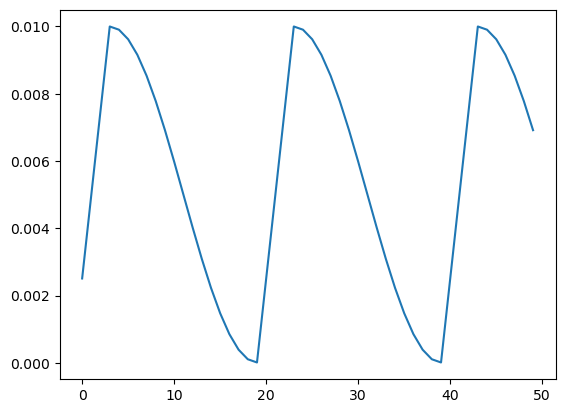

In [15]:
import torch
import matplotlib.pyplot as plt

model = torch.nn.Linear(2, 1)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.00001)
lr_scheduler = CosineAnnealingWarmUpRestarts(optimizer, first_cycle_steps=20, cycle_mult = 1.0, max_lr = 0.01, min_lr = 0.00001, warmup_steps = 4, gamma = 1.0, last_epoch = -1)


lrs = []

for i in range(num_epochs):
    lr_scheduler.step()
    lrs.append(optimizer.param_groups[0]["lr"])

plt.plot(lrs)

In [ ]:
# Case 2: Cosine Annealing with warm up start 사용
torch.manual_seed(7777)

criterion = nn.CrossEntropyLoss().to(device)
optimizer = torch.optim.Adam(resnet50_transfer.parameters(), lr=0.00001)
scheduler = CosineAnnealingWarmUpRestarts(optimizer, first_cycle_steps=20, cycle_mult = 1.0, max_lr = 0.01, min_lr = 0.00001, warmup_steps = 4, gamma = 1.0, last_epoch = -1)

val_every = 1
saved_dir = './saved'

### [Train]

In [ ]:
train(num_epochs, resnet50_transfer, train_loader, criterion, optimizer, scheduler, val_every, device, saved_dir, writer)

In [ ]:
# With TPUs
!pip show torch-xla

import torch_xla
import torch_xla.core.xla_model as xm
import torch_xla.distributed.xla_multiprocessing as xmp

def map_fn(index, flags):
    torch.manual_seed(7777)
    device = xm.xla_device()
    train(num_epochs, resnet50_transfer, train_loader, criterion, optimizer, scheduler, val_every, device, saved_dir, writer)

flags = {}
xmp.spawn(map_fn, args=(flags,), nprocs=8, start_method='fork')

### [Test]

##### Loading best model

- https://everywhere-data.tistory.com/61

In [11]:
from collections import OrderedDict

resnet_test = TransferResNet512(num_classes=5).to(device)
model_path = './saved/ckpoint_19_64.2%.pt'    # .pt 앞에 파일 이름 붙이기
checkpoint = torch.load(model_path, map_location=device)
print('loss: ', checkpoint['loss'])
if isinstance(resnet_test, nn.DataParallel):
    state_dict = checkpoint['model_state_dict']
else:
    original_state_dict = checkpoint['model_state_dict']
    state_dict = OrderedDict()
    for k, v in original_state_dict.items():
        name = k[7:] # remove 'module.'
        state_dict[name] = v
resnet_test.load_state_dict(state_dict)
resnet_test.eval()

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


loss:  0.8898647427558899


TransferResNet512(
  (ResNet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(

##### Actual test

In [20]:
with torch.no_grad():
    pred_list, answer_list, pred_proba_list = test(resnet_test, test_loader, device)

Start test..


0it [00:00, ?it/s]

Test accuracy for 8487 images: 65.10%


##### Confusion Matrix

In [23]:
pred_list = np.array([x for temp_list in pred_list for x in temp_list])
answer_list = np.array([x for temp_list in answer_list for x in temp_list])
pred_proba_list = np.array([x for temp_list in pred_proba_list for x in temp_list])

In [24]:
print(np.unique(pred_list))
print(pred_list.shape)
print(np.unique(answer_list))
print(answer_list.shape)
print(pred_proba_list.shape)

[0 1 2 3 4]
(8487,)
[0 1 2 3 4]
(8487,)
(8487, 5)


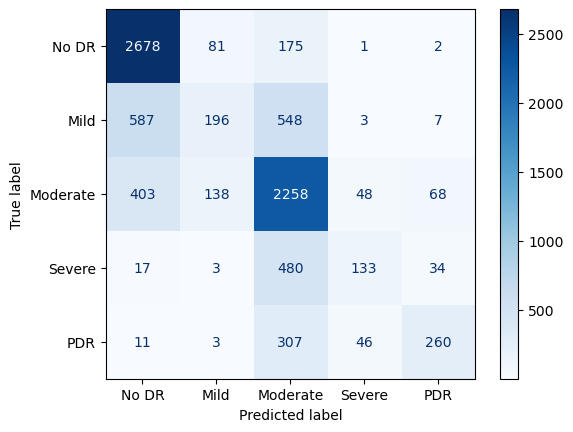

In [25]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
label_list = ['No DR', 'Mild', 'Moderate', 'Severe', 'PDR']
cm = confusion_matrix(answer_list, pred_list)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_list)
disp.plot(cmap='Blues')
plt.show()

##### Calculating sensitivity, specificity

https://bo-10000.tistory.com/89

In [26]:
from sklearn.metrics import confusion_matrix
def sensitivity_specificity_per_class(y, y_pred, y_class):
    y = np.where(y==y_class, 1, 0)
    y_pred = np.where(y_pred==y_class, 1, 0)
    cfx = confusion_matrix(y, y_pred)
    sensitivity = cfx[0,0]/(cfx[0,0]+cfx[0,1])
    specificity = cfx[1,1]/(cfx[1,0]+cfx[1,1])
    return sensitivity, specificity

In [27]:
idx2label = dict()
idx2label[0] = 'No DR'
idx2label[1] = 'Mild NPDR'
idx2label[2] = 'Moderate NPDR'
idx2label[3] = 'Severe NPDR'
idx2label[4] = 'PDR'

sensitivity_specificity_dict = dict()

for i in range(5): # 5 class라
    sensitivity, specificity = sensitivity_specificity_per_class(answer_list, pred_list, i)
    print(f'sensitivity for {idx2label[i]}: ', round(sensitivity,2))
    print(f'specificity for {idx2label[i]}: ', round(specificity,2))
    print('')
    sensitivity_specificity_dict[idx2label[i]]=[sensitivity, specificity]

print('')
print(sensitivity_specificity_dict)

sensitivity for No DR:  0.82
specificity for No DR:  0.91

sensitivity for Mild NPDR:  0.97
specificity for Mild NPDR:  0.15

sensitivity for Moderate NPDR:  0.73
specificity for Moderate NPDR:  0.77

sensitivity for Severe NPDR:  0.99
specificity for Severe NPDR:  0.2

sensitivity for PDR:  0.99
specificity for PDR:  0.41


{'No DR': [0.8165765765765766, 0.9118147769833163], 'Mild NPDR': [0.9685138539042821, 0.14615958240119314], 'Moderate NPDR': [0.7290021536252692, 0.7746140651801029], 'Severe NPDR': [0.9874680306905371, 0.19940029985007496], 'PDR': [0.9858778625954199, 0.41467304625199364]}


Sensitivity, specificity visualization
- https://jimmy-ai.tistory.com/40

In [28]:
import pandas as pd
data = sensitivity_specificity_dict
df = pd.DataFrame(data, index= ['Sensitivity', 'Specificity']).transpose()
label_list = ['No DR', 'Mild NPDR', 'Moderate NPDR',  'Severe NPDR', 'PDR']
df

,Sensitivity,Specificity
No DR,0.816577,0.911815
Mild NPDR,0.968514,0.146160
Moderate NPDR,0.729002,0.774614
Severe NPDR,0.987468,0.199400
PDR,0.985878,0.414673


C:\Users\김호영\AppData\Local\Temp\ipykernel_16928\730780269.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(i, df['Sensitivity'][i], str(round(df['Sensitivity'][i],2)), fontsize = 10, color='black',
C:\Users\김호영\AppData\Local\Temp\ipykernel_16928\730780269.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(i+ bar_width, df['Specificity'][i], str(round(df['Specificity'][i],2)), fontsize = 10, color='black',


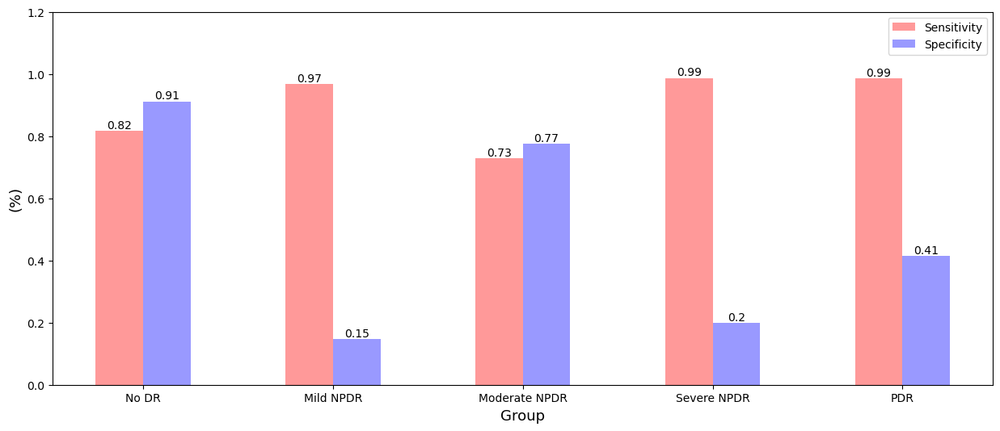

In [29]:
# 그림 사이즈, 바 굵기 조정
fig, ax = plt.subplots(figsize=(15,6))
bar_width = 0.25

# 범주가 5개이므로 0, 1, 2, 3, 4 위치를 기준으로 삼음
index = np.arange(5)

# 각 범주별로 Sensitivity, specificity의 bar를 순서대로 나타내는 과정, 각 그래프는 0.25의 간격을 두고 그려짐
b1 = plt.bar(index, df['Sensitivity'], bar_width, alpha=0.4, color='red', label='Sensitivity')
for i in [0, 1, 2, 3, 4]:
    plt.text(i, df['Sensitivity'][i], str(round(df['Sensitivity'][i],2)), fontsize = 10, color='black',
                horizontalalignment='center',  # horizontalalignment (left, center, right)
                verticalalignment='bottom')    # verticalalignment (top, center, bottom)
b2 = plt.bar(index + bar_width, df['Specificity'], bar_width, alpha=0.4, color='blue', label='Specificity')
for i in [0, 1, 2, 3, 4]:
    plt.text(i+ bar_width, df['Specificity'][i], str(round(df['Specificity'][i],2)), fontsize = 10, color='black',
                horizontalalignment='center',  # horizontalalignment (left, center, right)
                verticalalignment='bottom')    # verticalalignment (top, center, bottom)


# x축 위치를 정 가운데로 조정하고 x축의 텍스트를 year 정보와 매칭
plt.xticks(np.arange(bar_width/2, 5 + bar_width/2, 1), label_list)
plt.yticks(np.arange(0, 1.4, step=0.2))

# x축, y축 이름 및 범례 설정
plt.xlabel('Group', size = 13)
plt.ylabel('(%)', size = 13)
plt.legend()
plt.show()

##### Drawing ROC curve

https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html#sphx-glr-auto-examples-model-selection-plot-roc-py

- macro average 는 라벨별 f1-score를 산술평균
- weighted average 는 라벨별 f1-score를 샘플 수(support)의 비중에 따라 가중평균
- micro average는 전체 TP, FN, FP를 평균한 것이며 이것은 다중 분류에서 Accuracy와 같음

In [41]:
from sklearn.preprocessing import LabelBinarizer

label_list = ['No DR', 'Mild NPDR', 'Moderate NPDR',  'Severe NPDR', 'PDR']
label_binarizer = LabelBinarizer().fit(answer_list)
y_onehot_test = label_binarizer.transform(answer_list)
y_test = answer_list
y_score = pred_proba_list

class_id = 0        # 여기 수정 필요
class_of_interest = label_list[class_id]

print(y_onehot_test.shape)
print(y_onehot_test.ravel().shape)
print(y_score.shape)

(8487, 5)
(42435,)
(8487, 5)


In [42]:
print([round(x,2) for temp_list in y_score for x in temp_list])

[0.74, 0.12, 0.14, 0.0, 0.0, 0.01, 0.53, 0.44, 0.01, 0.0, 0.69, 0.25, 0.06, 0.0, 0.0, 0.91, 0.07, 0.02, 0.0, 0.0, 0.04, 0.15, 0.58, 0.07, 0.15, 0.0, 0.02, 0.23, 0.33, 0.42, 0.0, 0.01, 0.31, 0.14, 0.53, 0.01, 0.27, 0.59, 0.06, 0.07, 0.0, 0.2, 0.77, 0.02, 0.01, 0.01, 0.24, 0.61, 0.06, 0.09, 0.0, 0.01, 0.59, 0.21, 0.19, 0.0, 0.16, 0.8, 0.02, 0.02, 0.0, 0.0, 0.01, 0.01, 0.99, 0.0, 0.11, 0.75, 0.06, 0.08, 0.91, 0.07, 0.02, 0.0, 0.0, 0.0, 0.11, 0.64, 0.13, 0.12, 0.95, 0.04, 0.01, 0.0, 0.0, 0.82, 0.07, 0.1, 0.0, 0.0, 0.01, 0.33, 0.63, 0.02, 0.01, 0.0, 0.12, 0.7, 0.11, 0.07, 0.0, 0.09, 0.48, 0.11, 0.31, 0.67, 0.18, 0.15, 0.0, 0.0, 0.95, 0.03, 0.02, 0.0, 0.0, 0.0, 0.04, 0.58, 0.26, 0.12, 0.55, 0.08, 0.25, 0.05, 0.06, 0.0, 0.0, 0.24, 0.6, 0.15, 0.0, 0.09, 0.62, 0.14, 0.15, 0.0, 0.07, 0.74, 0.12, 0.07, 0.0, 0.16, 0.72, 0.07, 0.05, 0.0, 0.06, 0.42, 0.1, 0.42, 0.0, 0.03, 0.12, 0.02, 0.83, 0.0, 0.14, 0.68, 0.07, 0.11, 0.86, 0.07, 0.07, 0.0, 0.0, 0.01, 0.24, 0.69, 0.02, 0.03, 0.28, 0.33, 0.36, 0.01, 

- ROC curve using micro-averaged OvR

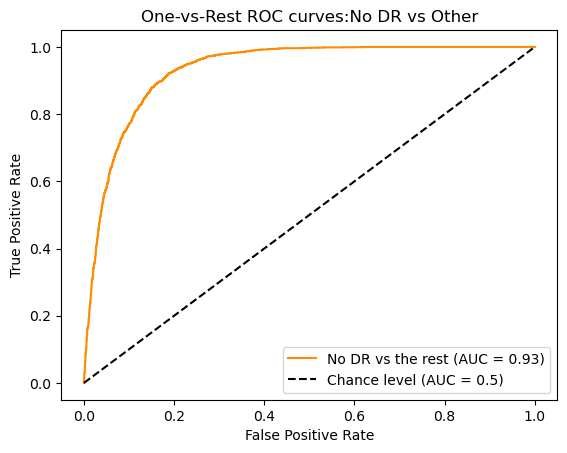

In [43]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay

display = RocCurveDisplay.from_predictions(
    y_onehot_test[:, class_id],
    y_score[:, class_id],
    name=f"{class_of_interest} vs the rest",
    color="darkorange",
    plot_chance_level=True,
)
_ = display.ax_.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title=f"One-vs-Rest ROC curves:{label_list[class_id]} vs Other",
)

In [44]:
# AUC만 계산하고 싶은 경우 (ROC-AUC score itself에 초점)
from sklearn.metrics import roc_auc_score

micro_roc_auc_ovr = roc_auc_score(y_test, y_score, multi_class="ovr",average="micro")
print(f"Micro-averaged One-vs-Rest ROC AUC score: {micro_roc_auc_ovr:.2f}")

Micro-averaged One-vs-Rest ROC AUC score: 0.90


In [45]:
# 위의 cell과 같은 의미
from sklearn.metrics import auc, roc_curve

# store the fpr, tpr, and roc_auc for all averaging strategies
fpr, tpr, roc_auc = dict(), dict(), dict()
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_onehot_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

print(f"Micro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['micro']:.2f}")

Micro-averaged One-vs-Rest ROC AUC score:
0.90


- ROC curve using the OvR macro-average

In [46]:
for i in range(len(label_list)):
    fpr[i], tpr[i], _ = roc_curve(y_onehot_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(len(label_list)):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= len(label_list)

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['macro']:.2f}")

Macro-averaged One-vs-Rest ROC AUC score:
0.87


In [47]:
# 위의 cell과 같은 계산 결과
macro_roc_auc_ovr = roc_auc_score(
    y_test,
    y_score,
    multi_class="ovr",
    average="macro",
)
print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{macro_roc_auc_ovr:.2f}")

Macro-averaged One-vs-Rest ROC AUC score:
0.87


- Plot all OvR ROC curves together

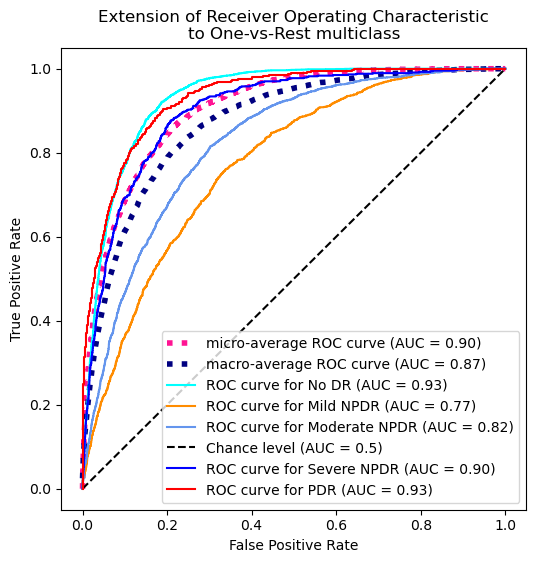

In [48]:
from itertools import cycle

fig, ax = plt.subplots(figsize=(6, 6))

plt.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)

plt.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue", "blue", "red"])
for class_id, color in zip(range(len(label_list)), colors):
    RocCurveDisplay.from_predictions(
        y_onehot_test[:, class_id],
        y_score[:, class_id],
        name=f"ROC curve for {label_list[class_id]}",
        color=color,
        ax=ax,
        plot_chance_level=(class_id == 2),
    )

_ = ax.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Extension of Receiver Operating Characteristic\nto One-vs-Rest multiclass",
)

- One-vs-One multiclass ROC

In [49]:
from itertools import combinations

pair_list = list(combinations(np.unique(y_test), 2))
print(pair_list)

[(0, 1), (0, 2), (0, 3), (0, 4), (1, 2), (1, 3), (1, 4), (2, 3), (2, 4), (3, 4)]


Macro-averaged One-vs-One ROC AUC score:
0.86


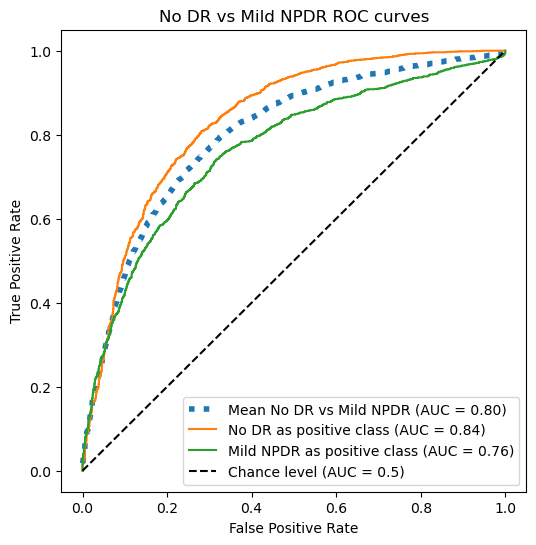

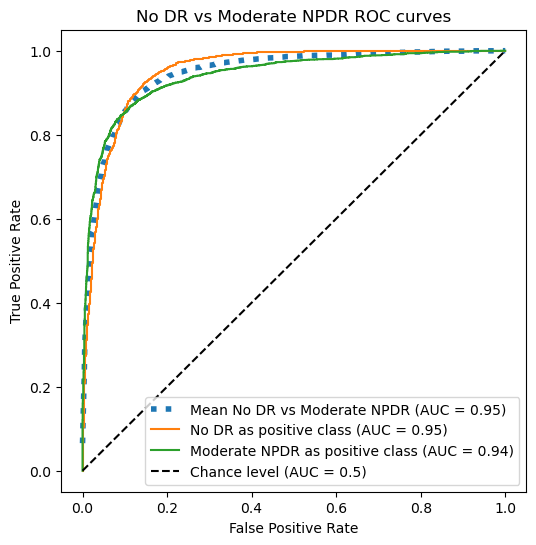

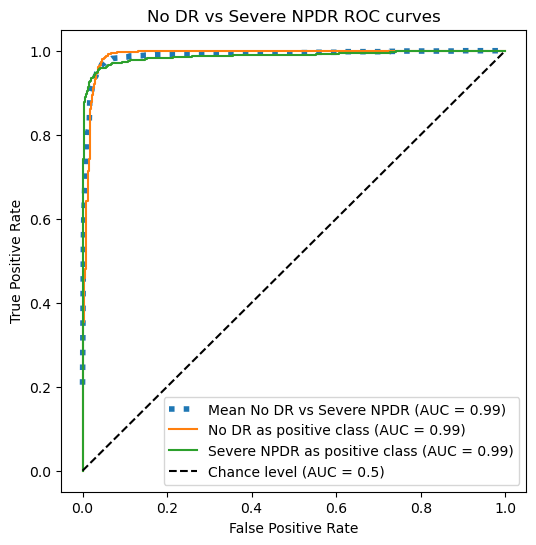

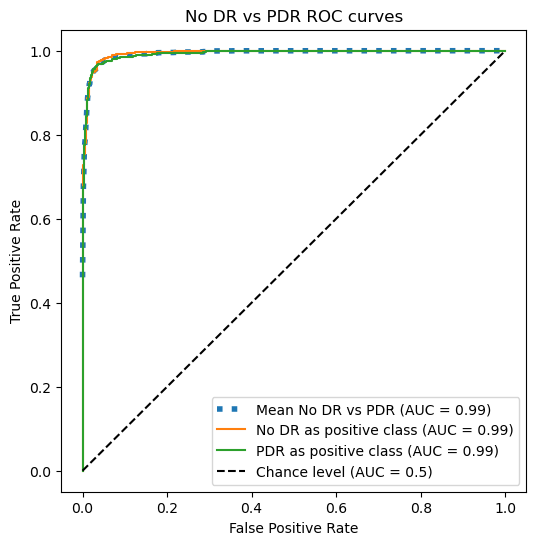

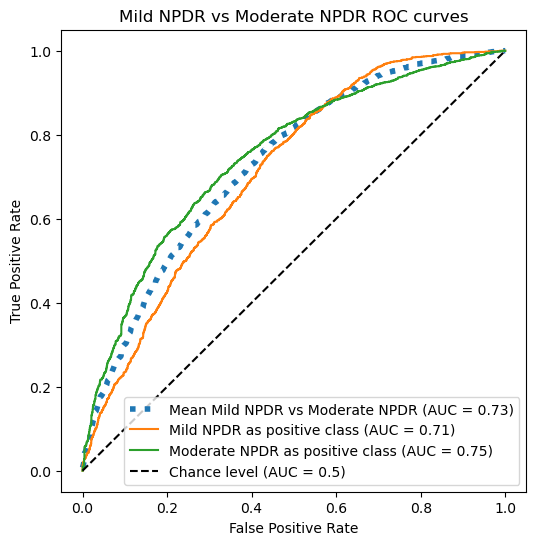

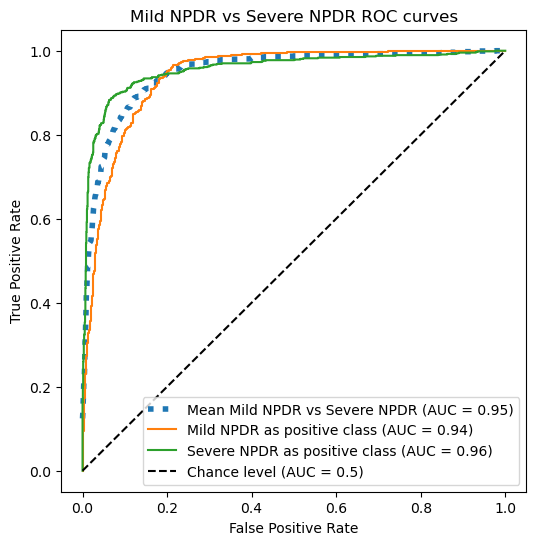

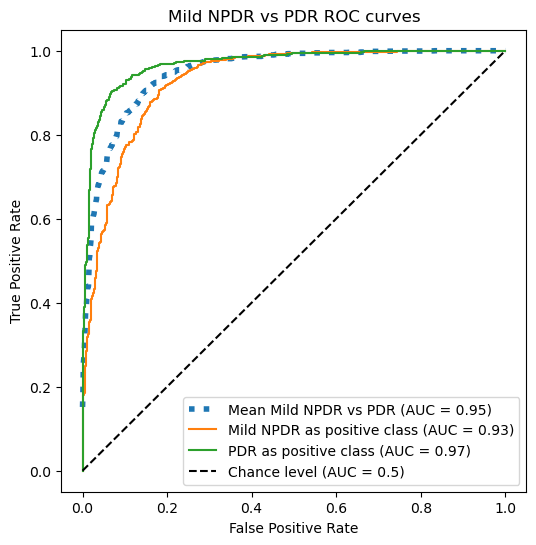

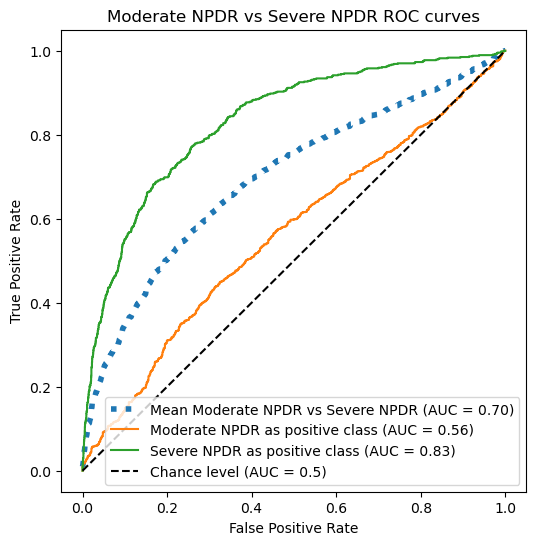

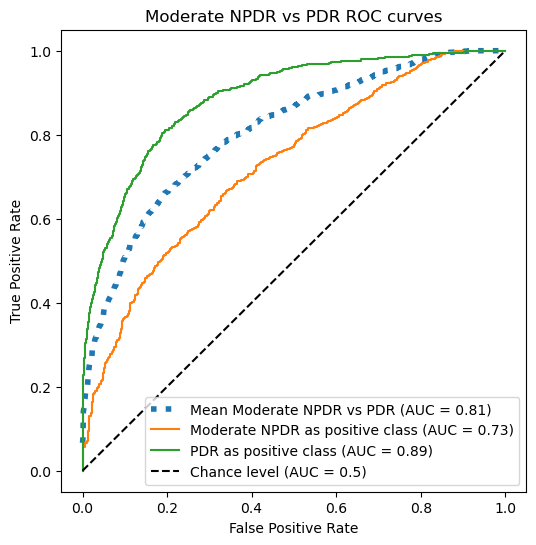

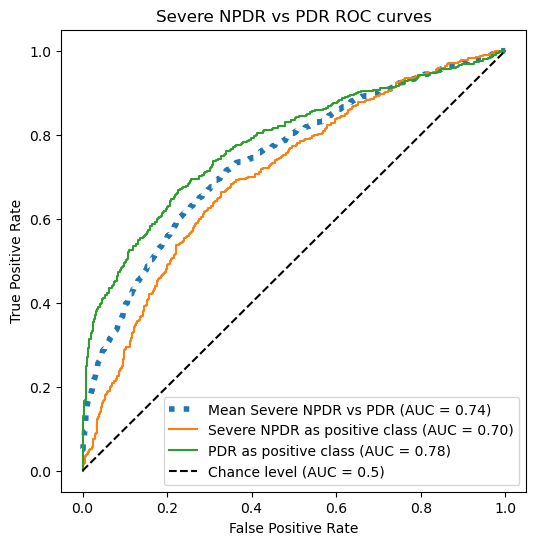

In [50]:
pair_scores = []
mean_tpr = dict()

for ix, (label_a, label_b) in enumerate(pair_list):
    a_mask = y_test == label_a
    b_mask = y_test == label_b
    ab_mask = np.logical_or(a_mask, b_mask)

    a_true = a_mask[ab_mask]
    b_true = b_mask[ab_mask]

    idx_a = np.flatnonzero(label_binarizer.classes_ == label_a)[0]
    idx_b = np.flatnonzero(label_binarizer.classes_ == label_b)[0]

    fpr_a, tpr_a, _ = roc_curve(a_true, y_score[ab_mask, idx_a])
    fpr_b, tpr_b, _ = roc_curve(b_true, y_score[ab_mask, idx_b])

    mean_tpr[ix] = np.zeros_like(fpr_grid)
    mean_tpr[ix] += np.interp(fpr_grid, fpr_a, tpr_a)
    mean_tpr[ix] += np.interp(fpr_grid, fpr_b, tpr_b)
    mean_tpr[ix] /= 2
    mean_score = auc(fpr_grid, mean_tpr[ix])
    pair_scores.append(mean_score)

    fig, ax = plt.subplots(figsize=(6, 6))
    plt.plot(
        fpr_grid,
        mean_tpr[ix],
        label=f"Mean {label_list[label_a]} vs {label_list[label_b]} (AUC = {mean_score :.2f})",
        linestyle=":",
        linewidth=4,
    )
    RocCurveDisplay.from_predictions(
        a_true,
        y_score[ab_mask, idx_a],
        ax=ax,
        name=f"{label_list[label_a]} as positive class",
    )
    RocCurveDisplay.from_predictions(
        b_true,
        y_score[ab_mask, idx_b],
        ax=ax,
        name=f"{label_list[label_b]} as positive class",
        plot_chance_level=True,
    )
    ax.set(
        xlabel="False Positive Rate",
        ylabel="True Positive Rate",
        title=f"{label_list[idx_a]} vs {label_list[label_b]} ROC curves",
    )

print(f"Macro-averaged One-vs-One ROC AUC score:\n{np.average(pair_scores):.2f}")

In [51]:
# AUC만 관심 있으면 아래처럼 하기
macro_roc_auc_ovo = roc_auc_score(
    y_test,
    y_score,
    multi_class="ovo",
    average="macro",
)

print(f"Macro-averaged One-vs-One ROC AUC score:\n{macro_roc_auc_ovo:.2f}")

Macro-averaged One-vs-One ROC AUC score:
0.86


- Plot all OvO ROC curves together

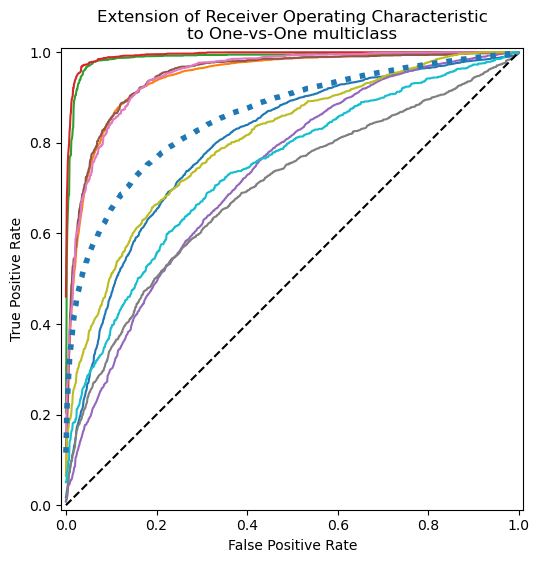

In [52]:
ovo_tpr = np.zeros_like(fpr_grid)

fig, ax = plt.subplots(figsize=(6, 6))
for ix, (label_a, label_b) in enumerate(pair_list):
    ovo_tpr += mean_tpr[ix]
    ax.plot(
        fpr_grid,
        mean_tpr[ix],
        label=f"Mean {label_list[label_a]} vs {label_list[label_b]} (AUC = {pair_scores[ix]:.2f})",
    )

ovo_tpr /= sum(1 for pair in enumerate(pair_list))

ax.plot(
    fpr_grid,
    ovo_tpr,
    label=f"One-vs-One macro-average (AUC = {macro_roc_auc_ovo:.2f})",
    linestyle=":",
    linewidth=4,
)
ax.plot([0, 1], [0, 1], "k--", label="Chance level (AUC = 0.5)")
_ = ax.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Extension of Receiver Operating Characteristic\nto One-vs-One multiclass",
    aspect="equal",
    xlim=(-0.01, 1.01),
    ylim=(-0.01, 1.01),
)


### [Visualization]

In [7]:
from collections import OrderedDict

resnet_test = TransferResNet512(num_classes=5).to(device)
model_path = './saved/ckpoint_19_64.2%.pt'    # .pt 앞에 파일 이름 붙이기
checkpoint = torch.load(model_path, map_location=device)
print('loss: ', checkpoint['loss'])
if isinstance(resnet_test, nn.DataParallel):
    state_dict = checkpoint['model_state_dict']
else:
    original_state_dict = checkpoint['model_state_dict']
    state_dict = OrderedDict()
    for k, v in original_state_dict.items():
        name = k[7:] # remove 'module.'
        state_dict[name] = v
resnet_test.load_state_dict(state_dict)
resnet_test.eval()

loss:  0.8898647427558899


TransferResNet512(
  (ResNet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(

In [8]:
import math

def img_crop(img):
    # 대각선만큼 상하좌우 패딩
    img_h, img_w = img.shape[0], img.shape[1]
    diag = int((img_h**2 + img_w ** 2)**0.5)    # 대각선 길이 구하기
    add_h, add_w = int((diag - img_h)/2), int((diag - img_w)/2)     # 상하좌우에 각각 추가될 padding의 길이 구하기
    img = cv2.copyMakeBorder(img, add_h, add_h, add_w, add_w, cv2.BORDER_CONSTANT,value=0)  # 0이라는 CONSTANT (검은색)으로 가장자리 추가

    # actan만큼 회전
    img_h, img_w = img.shape[0], img.shape[1]
    degree = math.degrees(math.atan(img_h / img_w)) # actan에 해당하는 각도 구하기
    x_center, y_center = int(img_h/2), int(img_w/2) # 이미지 중심의 좌표 구하기
    matrix = cv2.getRotationMatrix2D((x_center, y_center), -degree, 1)  # 중심을 기준으로 해서 시계방향으로 degree만큼 (-degree) 회전하는 행렬 구하기, scal (확대 비율)은 그대로 1
    img = cv2.warpAffine(img, matrix, (diag, diag))   # 구한 rotation matrix를 img에 적용
    
    # Crop하기
    img = cv2.copyMakeBorder(img, 10,10,10,10,cv2.BORDER_CONSTANT,value=[0,0,0])    # 회전시킨 영상에서 다시 상하좌우 10만큼 검은색 배경 추가 -> border를 잘 자르기 위해서
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, gray = cv2.threshold(gray, 5, 255, cv2.THRESH_BINARY)    # 밝기 5 이하를 0, 그 이상은 255로 처리 -> 배경을 싹다 0으로 만들어주기
    contours,hierarchy = cv2.findContours(gray,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
        # 여기서 gray를 binary로 넣어야 해서 gray로 시작하는 image 전처리가 필요함
        # cv2.RETR_EXTERNAL: 가장 바깥쪽 라인만 생성
        # cv2.CHAIN_APPROX_SIMPLE: 컨투어 꼭짓점 좌표만 제공 -> 가장 바깥쪽 원의 좌표만 제공
    contours = max(contours, key=cv2.contourArea)
    x,y,w,h = cv2.boundingRect(contours)
        # 주어진 점을 감싸는 최소 크기 사각형(바운딩 박스)를 반환 -> x,y,w,h는 bounding box에 대한 좌표
    img = img[y:y+h, x:x+w]
    img_H, img_W = img.shape[0], img.shape[1]
    ret = max(img_H, img_W)

    # 반대 rotation
    img_H, img_W = img.shape[0], img.shape[1]
    x_center, y_center = int(img_H/2), int(img_W/2)
    matrix = cv2.getRotationMatrix2D((x_center, y_center), degree, 1)   # 반대로 rotation
    img = cv2.warpAffine(img, matrix, (img_H, img_W))
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _,gray = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
    contours,hierarchy = cv2.findContours(gray,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    contours = max(contours, key=cv2.contourArea)
    x,y,w,h = cv2.boundingRect(contours)
    img = img[y:y+h, x:x+w]
    return img

def img_resize(img):
    if min(img.shape[0], img.shape[1]) <= 1024: # 이미지 size가 1024보다 작아서 확대해야 하는 경우
        img = cv2.resize(img, dsize=(512,512), interpolation=cv2.INTER_CUBIC)
    else:   # 이미지 size가 1024보다 커서 축소 해야 하는 경우
        img = cv2.resize(img, dsize=(512,512), interpolation=cv2.INTER_AREA)
    return img

def preprocessing(data_path):
    '''
    Input: image path
    Output: image after crop + resize
            size = (512, 512, 3)
    '''
    img = cv2.imread(data_path)
    #img = img_crop(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img_crop(img)
    img = img_resize(img)
    return img

##### Visualizing using matplotlib

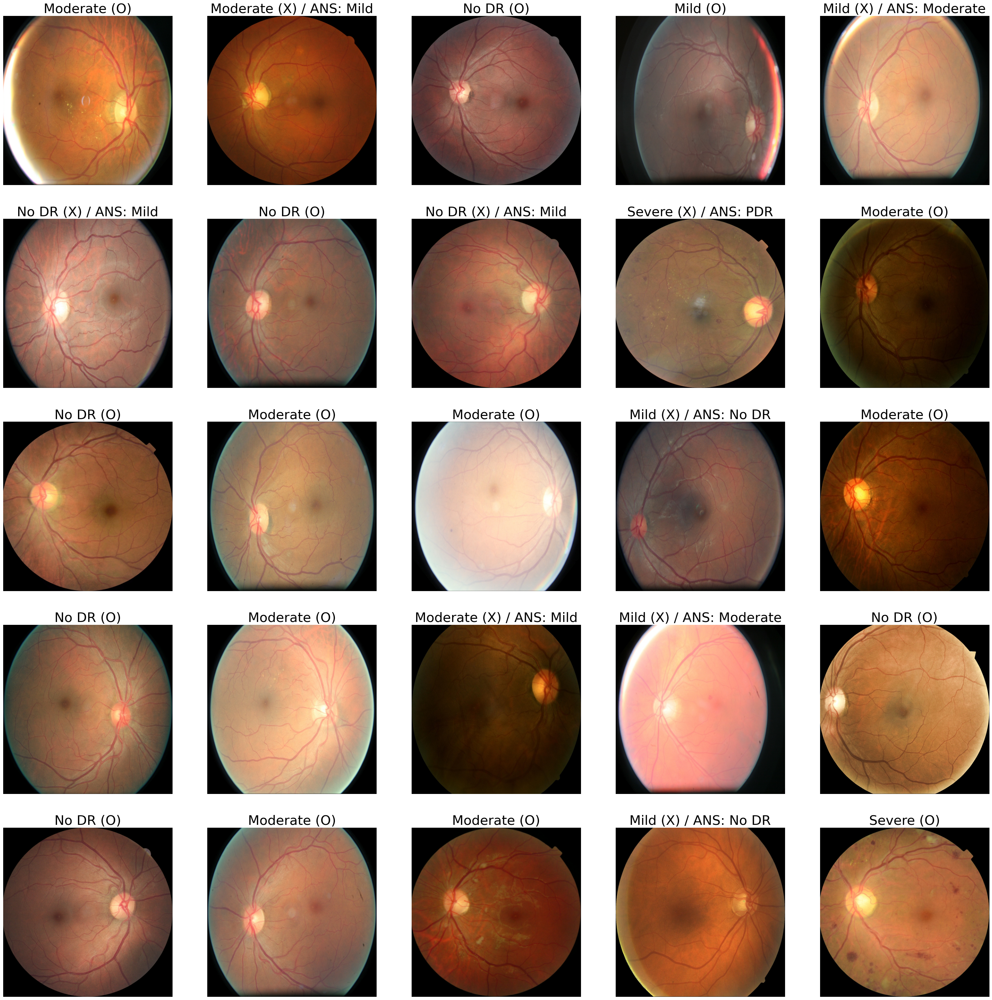

In [51]:
idx2label = dict()
idx2label[0] = 'No DR'
idx2label[1] = 'Mild'
idx2label[2] = 'Moderate'
idx2label[3] = 'Severe'
idx2label[4] = 'PDR'

test_csv = pd.read_csv(os.path.join('../data','test_label.csv'), index_col=0)

columns = 5
rows = 5
fig = plt.figure(figsize=(40,40))

original_img_path = sorted(glob.glob(os.path.join('../data','original data','sorted','*', '*')))
test_preprocessed_path = sorted(glob.glob(os.path.join('../data', 'preprocessed_512','test','*')))
test_transform = transforms.Compose([transforms.ToTensor()])

resnet_test.eval()

for i in range(1, columns*rows+1):
    data_idx = np.random.randint(len(test_csv))
    input_img_path = test_preprocessed_path[data_idx]
    id = os.path.basename(input_img_path).split('.')[0]
    img_path = [x for x in original_img_path if os.path.basename(x) == os.path.basename(input_img_path)]
    
    img = preprocessing(*img_path)

    input_img = Image.open(input_img_path)
    input_img = test_transform(input_img)
    input_img = input_img.unsqueeze(0)
    output = resnet_test(input_img)
    _, argmax = torch.max(output, 1)
    pred = argmax.item()
    label = test_csv['diagnosis'][id]

    fig.add_subplot(rows, columns, i)
    
    if pred == label:
        plt.title(f'{idx2label[pred]} (O)', fontsize=30)   # 맞은 경우 (O)로 표시
    else:
        plt.title(f'{idx2label[pred]} (X) / ANS: {idx2label[label]}', fontsize=30)   # 틀린 경우 (X)로 표시
    plt.imshow(img)
    plt.axis('off')
resnet_test.train()
plt.show()

##### Predicted values

<Figure size 1000x1000 with 0 Axes>

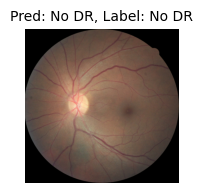

- No DR: 87.33%
- Mild NPDR: 9.26%
- Moderate NPDR: 3.4%
- Severe NPDR: 0.01%
- PDR: 0.0%


<Figure size 1000x1000 with 0 Axes>

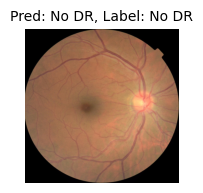

- No DR: 87.57%
- Mild NPDR: 9.11%
- Moderate NPDR: 3.28%
- Severe NPDR: 0.04%
- PDR: 0.0%


<Figure size 1000x1000 with 0 Axes>

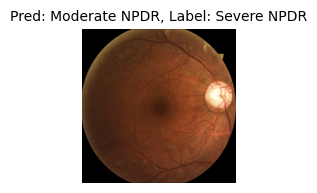

- Moderate NPDR: 66.54%
- Severe NPDR: 26.19%
- PDR: 6.22%
- Mild NPDR: 1.05%
- No DR: 0.0%


<Figure size 1000x1000 with 0 Axes>

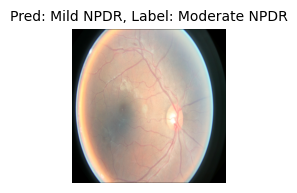

- Mild NPDR: 49.02%
- Moderate NPDR: 28.55%
- No DR: 20.42%
- Severe NPDR: 1.8%
- PDR: 0.21%


<Figure size 1000x1000 with 0 Axes>

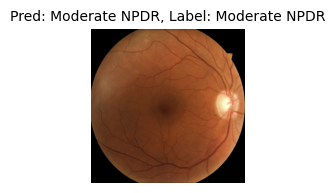

- Moderate NPDR: 50.52%
- Mild NPDR: 49.03%
- Severe NPDR: 0.22%
- No DR: 0.2%
- PDR: 0.02%


TransferResNet512(
  (ResNet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(

In [52]:
# 5개의 임의의 image에 대해 percentage 추출하기

idx2label = dict()
idx2label[0] = 'No DR'
idx2label[1] = 'Mild NPDR'
idx2label[2] = 'Moderate NPDR'
idx2label[3] = 'Severe NPDR'
idx2label[4] = 'PDR'

label_list = ['No DR', 'Mild NPDR', 'Moderate NPDR', 'Severe NPDR', 'PDR']

test_csv = pd.read_csv(os.path.join('../data','test_label.csv'), index_col=0)
original_img_path = sorted(glob.glob(os.path.join('../data','original data','sorted','*', '*')))
test_preprocessed_path = sorted(glob.glob(os.path.join('../data', 'preprocessed_512','test','*')))
test_transform = transforms.Compose([transforms.ToTensor()])

resnet_test.eval()
with torch.no_grad():
    for i in range(1,6):
        fig = plt.figure(figsize=(10,10))

        data_idx = np.random.randint(len(test_csv))
        input_img_path = test_preprocessed_path[data_idx]
        id = os.path.basename(input_img_path).split('.')[0]
        img_path = [x for x in original_img_path if os.path.basename(x) == os.path.basename(input_img_path)]
        
        img = preprocessing(*img_path)

        input_img = Image.open(input_img_path)
        input_img = test_transform(input_img)
        input_img = input_img.unsqueeze(0)
        output = resnet_test(input_img)
        pred_percent = F.softmax(output, dim=1)*100
        
        pred_percent = pred_percent.squeeze().tolist()
        pred_dict = {key: value for key, value in zip(label_list, pred_percent)}
        pred = sorted(pred_dict.items(), key = lambda x: x[1], reverse = True)
        
        label = test_csv['diagnosis'][id]

        plt.figure(figsize=(2,2))
        plt.imshow(img)    # 3channel이라 [0]만 뽑아냄
        plt.title(f'Pred: {pred[0][0]}, Label: {idx2label[label]}', fontsize=10)
        plt.axis('off')
        plt.show()
        
        for i in range(len(pred)):
            print(f'- {pred[i][0]}: {round(pred[i][1],2)}%')
    
resnet_test.train()

##### GRAD-CAM

- https://csm-kr.tistory.com/74

In [ ]:
from collections import OrderedDict

resnet_test = TransferResNet512(num_classes=5).to(device)
model_path = './saved/ckpoint_19_64.2%.pt'    # .pt 앞에 파일 이름 붙이기
checkpoint = torch.load(model_path, map_location=device)
print('loss: ', checkpoint['loss'])
if isinstance(resnet_test, nn.DataParallel):
    state_dict = checkpoint['model_state_dict']
else:
    original_state_dict = checkpoint['model_state_dict']
    state_dict = OrderedDict()
    for k, v in original_state_dict.items():
        name = k[7:] # remove 'module.'
        state_dict[name] = v
resnet_test.load_state_dict(state_dict)
resnet_test.eval()

In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class GradCam(nn.Module):
    def __init__(self, model, module1, module2, layer):
        super().__init__()
        self.model = model
        self.module1 = module1
        self.module2 = module2
        self.layer = layer
        self.register_hooks()

    def register_hooks(self):
        for module1_name, module in self.model._modules.items():
            if module1_name == self.module1:
                for module2_name, module in module._modules.items():
                    if module2_name == self.module2:
                        for layer_name, module in module._modules.items():
                            if layer_name == self.layer:
                                module.register_forward_hook(self.forward_hook)
                                module.register_backward_hook(self.backward_hook)

    def forward(self, input, target_index):
        outs = self.model(input)
        outs = outs.squeeze()  # [1, num_classes]  --> [num_classes]
		
        # 가장 큰 값을 가지는 것을 target index 로 사용 
        if target_index is None:
            target_index = outs.argmax()

        outs[target_index].backward(retain_graph=True)
        a_k = torch.mean(self.backward_result, dim=(1, 2), keepdim=True)         # [512, 1, 1]
        out = torch.sum(a_k * self.forward_result, dim=0).cpu()                  # [512, 7, 7] * [512, 1, 1]
        out = torch.relu(out) / torch.max(out)  # 음수를 없애고, 0 ~ 1 로 scaling # [7, 7]
        out = F.upsample_bilinear(out.unsqueeze(0).unsqueeze(0), [512, 512])  # 4D로 바꿈
        return out.cpu().detach().squeeze().numpy()

    def forward_hook(self, _, input, output):
        self.forward_result = torch.squeeze(output)

    def backward_hook(self, _, grad_input, grad_output):
        self.backward_result = torch.squeeze(grad_output[0])

In [17]:
import os
import cv2
import glob
import numpy as np

'''def preprocess_image(img):
    preprocessed_img = img.copy()[:, :, ::-1]
    preprocessed_img = preprocessed_img - means
    preprocessed_img = preprocessed_img/stds
    for i in range(3):
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] - means[i]
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] / stds[i]
    preprocessed_img = \
        np.ascontiguousarray(np.transpose(preprocessed_img, (2, 0, 1)))
    preprocessed_img = torch.from_numpy(preprocessed_img)
    preprocessed_img.unsqueeze_(0)
    input = preprocessed_img.requires_grad_(True)
    return input
'''
def show_cam_on_image(img, mask):
    # mask = (np.max(mask) - np.min(mask)) / (mask - np.min(mask))
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    imgRGB = cv2.cvtColor(cam, cv2.COLOR_BGR2RGB)
    return imgRGB

In [90]:
test_csv = pd.read_csv(os.path.join('../data','test_label.csv'), index_col=0)
original_img_path = sorted(glob.glob(os.path.join('../data','original data','sorted','*', '*')))
test_preprocessed_path = sorted(glob.glob(os.path.join('../data', 'preprocessed_512','test','*')))
test_transform = transforms.Compose([transforms.ToTensor()])

In [103]:
data_idx = np.random.randint(len(test_csv))
input_img_path = test_preprocessed_path[data_idx]
id = os.path.basename(input_img_path).split('.')[0]
img_path = [x for x in original_img_path if os.path.basename(x) == os.path.basename(input_img_path)]
label = test_csv['diagnosis'][id]
print(input_img_path)
print(label)

../data\preprocessed_512\test\44ecf3f4efa5.jpg
4


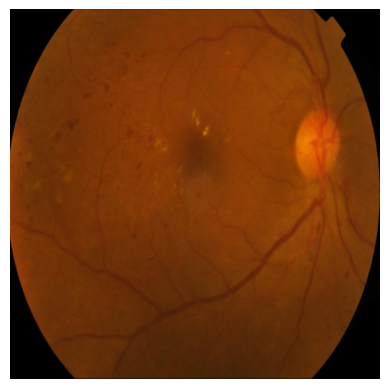

In [104]:
img = preprocessing(*img_path)

input_img = Image.open(input_img_path)
input_img = test_transform(input_img)
input_img = input_img.unsqueeze(0)
output = resnet_test(input_img)
_, argmax = torch.max(output, 1)
pred = argmax.item()
label = test_csv['diagnosis'][id]

plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(img)
plt.show()

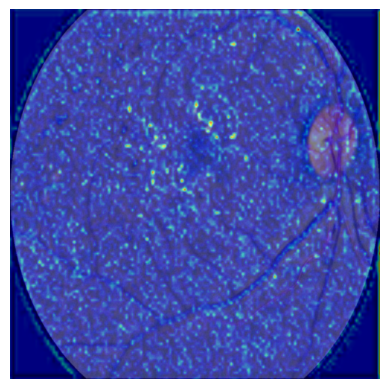

In [110]:
# Layer 1 Bottleneck 2 Conv3에 관한 내용 (Layer 1의 가장 마지막)
grad_cam = GradCam(model=resnet_test.ResNet50, module1='layer1',module2 ='2', layer='conv3')
mask = grad_cam(input_img, None)
result = show_cam_on_image(np.float32(Image.open(input_img_path))/255, mask)
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(result)
plt.show()

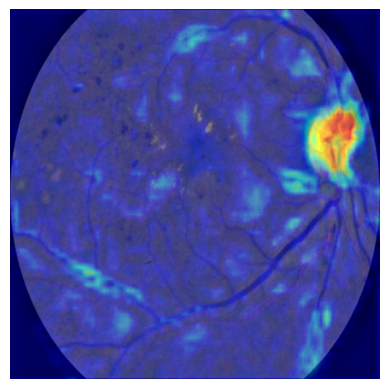

In [111]:
# Layer 2 Bottleneck 2 Conv3에 관한 내용 (Layer 2의 가장 마지막)
grad_cam = GradCam(model=resnet_test.ResNet50, module1='layer2',module2 ='2', layer='conv3')
mask = grad_cam(input_img, None)
result = show_cam_on_image(np.float32(Image.open(input_img_path))/255, mask)
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(result)
plt.show()

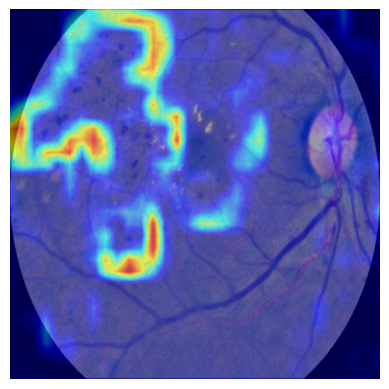

In [112]:
# Layer 3 Bottleneck 2 Conv3에 관한 내용 (Layer 1의 가장 마지막)
grad_cam = GradCam(model=resnet_test.ResNet50, module1='layer3',module2 ='2', layer='conv3')
mask = grad_cam(input_img, None)
result = show_cam_on_image(np.float32(Image.open(input_img_path))/255, mask)
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(result)
plt.show()

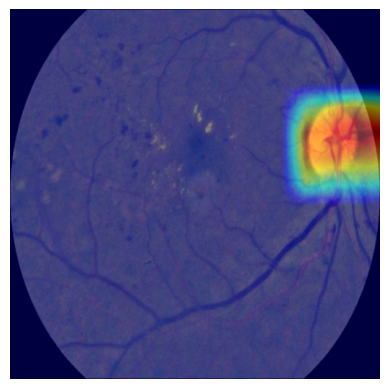

In [113]:
# Layer 4 Bottleneck 3 Conv3에 관한 내용 (Layer 4의 가장 마지막)
grad_cam = GradCam(model=resnet_test.ResNet50, module1='layer4',module2 ='2', layer='conv3')
mask = grad_cam(input_img, None)
result = show_cam_on_image(np.float32(Image.open(input_img_path))/255, mask)
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(result)
plt.show()

In [126]:
test_csv = pd.read_csv(os.path.join('../data','test_label.csv'), index_col=0)
original_img_path = sorted(glob.glob(os.path.join('../data','original data','sorted','*', '*')))
test_preprocessed_path = sorted(glob.glob(os.path.join('../data', 'preprocessed_512','test','*')))
test_transform = transforms.Compose([transforms.ToTensor()])

In [167]:
data_idx = np.random.randint(len(test_csv))
input_img_path = test_preprocessed_path[data_idx]
id = os.path.basename(input_img_path).split('.')[0]
img_path = [x for x in original_img_path if os.path.basename(x) == os.path.basename(input_img_path)]
label = test_csv['diagnosis'][id]
print(input_img_path)
print(label)
img = preprocessing(*img_path)

input_img = Image.open(input_img_path)
input_img = test_transform(input_img)
input_img = input_img.unsqueeze(0)
output = resnet_test(input_img)
_, argmax = torch.max(output, 1)
pred = argmax.item()
print(pred)

../data\preprocessed_512\test\42824_right.jpg
3
2


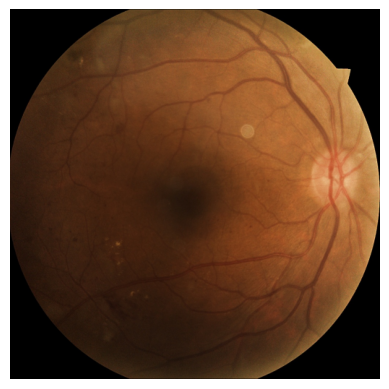

In [168]:
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(img)
plt.show()

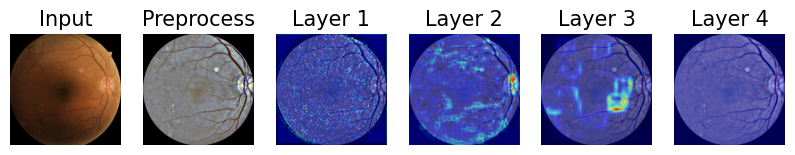

In [169]:
# Layer 1,2,3,4 각각의 마지막 conv layer에 대한 grad cam
fig = plt.figure(figsize=(10,40))
fig.add_subplot(1, 6, 1)
plt.title('Input', fontsize=15)
plt.imshow(img)
plt.axis('off') # 창에있는 x축 y축 제거
fig.add_subplot(1, 6, 2)
plt.title('Preprocess', fontsize=15)
plt.imshow(Image.open(input_img_path))
plt.axis('off')

for i in range(1,5):
    grad_cam = GradCam(model=resnet_test.ResNet50, module1='layer'+str(i),module2 ='2', layer='conv3')
    mask = grad_cam(input_img, None)
    result = show_cam_on_image(np.float32(Image.open(input_img_path))/255, mask)
    fig.add_subplot(1, 6, i+2)
    plt.title(f'Layer {i}', fontsize=15)
    plt.imshow(result)
    plt.axis('off') # 창에있는 x축 y축 제거
plt.show()

##### GRAD-CAM (Another version)

- https://cumulu-s.tistory.com/41
- https://github.com/PeterKim1/paper_code_review/tree/master/9.%20Visual%20Explanations%20from%20Deep%20Networks%20via%20Gradient-based%20Localization(Grad-CAM)

In [448]:
from collections import OrderedDict

resnet_test = TransferResNet512(num_classes=5).to(device)
model_path = './saved/ckpoint_19_64.2%.pt'    # .pt 앞에 파일 이름 붙이기
checkpoint = torch.load(model_path, map_location=device)
print('loss: ', checkpoint['loss'])
if isinstance(resnet_test, nn.DataParallel):
    state_dict = checkpoint['model_state_dict']
else:
    original_state_dict = checkpoint['model_state_dict']
    state_dict = OrderedDict()
    for k, v in original_state_dict.items():
        name = k[7:] # remove 'module.'
        state_dict[name] = v
resnet_test.load_state_dict(state_dict)
resnet_test.eval()

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


loss:  0.8898647427558899


TransferResNet512(
  (ResNet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(

In [449]:
test_csv = pd.read_csv(os.path.join('../data','test_label.csv'), index_col=0)
original_img_path = sorted(glob.glob(os.path.join('../data','original data','sorted','*', '*')))
test_preprocessed_path = sorted(glob.glob(os.path.join('../data', 'preprocessed_512','test','*')))
test_transform = transforms.Compose([transforms.ToTensor()])

data_idx = np.random.randint(len(test_csv))
input_img_path = test_preprocessed_path[data_idx]
id = os.path.basename(input_img_path).split('.')[0]
img_path = [x for x in original_img_path if os.path.basename(x) == os.path.basename(input_img_path)]
label = test_csv['diagnosis'][id]
print(input_img_path)
print(label)
img = preprocessing(*img_path)

input_img = Image.open(input_img_path)
input_img = test_transform(input_img)
input_img = input_img.unsqueeze(0)
output = resnet_test(input_img)
_, argmax = torch.max(output, 1)
pred = argmax.item()
print(pred)

../data\preprocessed_512\test\913490237ad4.jpg
3
3


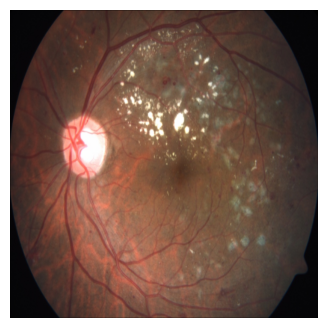

In [450]:
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(img)
plt.show()

In [451]:
import datetime

current_time = datetime.datetime.now()
str_time = str(current_time.year)+str('_{0:02d}_'.format(current_time.month))+str('{0:02d}__'.format(current_time.day))+str('{0:02d}_'.format(current_time.hour))+str('{0:02d}'.format(current_time.minute))
dir_name = 'GradCAM_'+str_time

saved_loc = os.path.join('./output/GradCAM', dir_name)
if os.path.exists(saved_loc):
    user_input = input('Warning! rmtree 메소드는 하위 디렉토리 및 모든파일들을 삭제합니다. 계속하겠습니까? (y/n): ')
    if user_input == 'y':
        shutil.rmtree(saved_loc)
    else:
        print('중단되었습니다.')
os.mkdir(saved_loc)

print("결과 저장 위치: ", saved_loc)

결과 저장 위치:  ./output/GradCAM\GradCAM_2024_05_22__21_19


In [452]:
'''def normalize(tensor, mean, std):
    if not tensor.ndimension() == 4:
        raise TypeError('tensor should be 4D')

    mean = torch.FloatTensor(mean).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)
    std = torch.FloatTensor(std).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)

    return tensor.sub(mean).div(std)


class Normalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return self.do(tensor)
    
    def do(self, tensor):
        return normalize(tensor, self.mean, self.std)
    
    def undo(self, tensor):
        return denormalize(tensor, self.mean, self.std)

    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)'''

"def normalize(tensor, mean, std):\n    if not tensor.ndimension() == 4:\n        raise TypeError('tensor should be 4D')\n\n    mean = torch.FloatTensor(mean).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)\n    std = torch.FloatTensor(std).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)\n\n    return tensor.sub(mean).div(std)\n\n\nclass Normalize(object):\n    def __init__(self, mean, std):\n        self.mean = mean\n        self.std = std\n\n    def __call__(self, tensor):\n        return self.do(tensor)\n    \n    def do(self, tensor):\n        return normalize(tensor, self.mean, self.std)\n    \n    def undo(self, tensor):\n        return denormalize(tensor, self.mean, self.std)\n\n    def __repr__(self):\n        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)"

In [453]:
from torch.autograd import Function

class GuidedBackpropReLU(Function):
    @staticmethod
    def forward(self, input_img):
        # input image 기준으로 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask = (input_img > 0).type_as(input_img)
        
        # torch.addcmul(input, tensor1, tensor2) => output = input + tensor1 x tensor 2
        # input image와 동일한 사이즈의 torch.zeros를 만든 뒤, input image와 positive_mask를 곱해서 output 생성
        # 결국은 ReLU와 동일한 효과
        output = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), input_img, positive_mask)
        
        # backward에서 사용될 forward의 input이나 output을 저장
        self.save_for_backward(input_img, output)
        return output

    @staticmethod
    def backward(self, grad_output):
        
        # forward에서 저장된 saved tensor를 불러오기
        input_img, output = self.saved_tensors
        grad_input = None

        # input image 기준으로 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask_1 = (input_img > 0).type_as(grad_output)
        
        # 모델의 결과 (gradient)가 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask_2 = (grad_output > 0).type_as(grad_output)
        
        # 먼저 모델의 결과와 positive_mask_1과 곱해주고,
        # 다음으로는 positive_mask_2와 곱해줘서 
        # 모델의 결과가 양수이면서 input image가 양수인 부분만 남도록 만들어줌
        grad_input = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img),
                                   torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), grad_output,
                                                 positive_mask_1), positive_mask_2)
        return grad_input

In [454]:
class GuidedBackpropReLUModel:
    def __init__(self, model, use_cuda):
        self.model = model
        self.model.eval()
        self.cuda = use_cuda
        if self.cuda:
            self.model = model.cuda()

        def recursive_relu_apply(module_top):
            for idx, module in module_top._modules.items():
                recursive_relu_apply(module)
                if module.__class__.__name__ == 'ReLU':
                    module_top._modules[idx] = GuidedBackpropReLU.apply

        # replace ReLU with GuidedBackpropReLU
        recursive_relu_apply(self.model)

    def forward(self, input_img):
        return self.model(input_img)

    def __call__(self, input_img, target_category=None):        # target_category에 원하는 class를 넣기
        if self.cuda:
            input_img = input_img.cuda()

        input_img = input_img.requires_grad_(True)

        output = self.forward(input_img)

        if target_category is None:
            target_category = np.argmax(output.cpu().data.numpy())

        one_hot = np.zeros((1, output.size()[-1]), dtype=np.float32)
        one_hot[0][target_category] = 1 # target_category에 해당하는 번째의 숫자만 1이고 나머지는 다 0
        one_hot = torch.from_numpy(one_hot).requires_grad_(True)
        if self.cuda:
            one_hot = one_hot.cuda()

        one_hot = torch.sum(one_hot * output)   # 원하는 output에 대한 예측만 빼냄
        # 모델이 예측한 결과값을 기준으로 backward 진행
        one_hot.backward(retain_graph=True)

        # input image의 gradient를 저장
        output = input_img.grad.cpu().data.numpy()
        output = output[0, :, :, :]
        output = output.transpose((1, 2, 0))
        return output

In [455]:
def deprocess_image(img):
    """ see https://github.com/jacobgil/keras-grad-cam/blob/master/grad-cam.py#L65 """
    img = img - np.mean(img)
    img = img / (np.std(img) + 1e-5)
    img = img * 0.1
    img = img + 0.5
    img = np.clip(img, 0, 1)
    return np.uint8(img * 255)

In [456]:
# final conv layer name 
finalconv_name = 'conv3'

# activations
feature_blobs = []

# gradients
backward_feature = []

# output으로 나오는 feature를 feature_blobs에 append하도록
def hook_feature(module, input, output):
    feature_blobs.append(output.cpu().data)
    

# Grad-CAM
def backward_hook(module, input, output):
    backward_feature.append(output[0])
    
resnet_test.ResNet50.layer4[2]._modules.get(finalconv_name).register_forward_hook(hook_feature)
resnet_test.ResNet50.layer4[2]._modules.get(finalconv_name).register_backward_hook(backward_hook)

In [457]:
# get the softmax weight
params = list(resnet_test.parameters())
weight_softmax = np.squeeze(params[-2].cpu().detach().numpy())
# Prediction
logit = resnet_test(input_img)
h_x = F.softmax(logit, dim=1).data.squeeze() # softmax 적용

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


In [458]:
# ==== Grad-CAM main lines ==== #
_, argmax = torch.max(logit, 1)
label_index = argmax.item()

score = logit[:, label_index].squeeze() # 예측값 y^c
score.backward(retain_graph = True) # 예측값 y^c에 대해서 backprop 진행

In [459]:
print(np.unique(np.array(feature_blobs)))

[-2344.8923 -2186.6912 -2070.3699 ...  1578.2888  1615.2732  1684.4261]


In [460]:
print(np.array(feature_blobs).shape)

(1, 1, 2048, 16, 16)


In [461]:
print(np.array(backward_feature).shape)

(1, 1, 2048, 16, 16)


In [462]:
activations = feature_blobs[0].to(device) # (1, 2048, 16, 16), forward pass를 진행하면서 얻게 되는 마지막 conv layer의 feature map: forward activations
gradients = backward_feature[0] # (1, 2048, 16, 16), 마지막 conv layer의 feature map의 gradient, backward gradients
b, k, u, v = gradients.size()

alpha = gradients.view(b, k, -1).mean(2) # (1, 2048, 16*16) => (1, 2048), feature map k의 'importance'를 의미
                                        # 3번째 차원을 기준으로 평균내기
weights = alpha.view(b, k, 1, 1) # (1, 2048, 1, 1)

In [463]:
# Linear combination
grad_cam_map = (weights*activations).sum(1, keepdim = True) # alpha * A^k = (1, 2048, 16, 16) => (1, 1, 16, 16): 두 번째 차원으로 더해주기
grad_cam_map = F.relu(grad_cam_map) # Apply R e L U -> 여기까지가 아래 (2)번식 구현
grad_cam_map = F.interpolate(grad_cam_map, size=(512, 512), mode='bilinear', align_corners=False) # (1, 1, 512, 512)로 Upsampling
map_min, map_max = grad_cam_map.min(), grad_cam_map.max()
grad_cam_map = (grad_cam_map - map_min).div(map_max - map_min).data # (1, 1, 512, 512), min-max scaling

In [464]:
# grad_cam_map.squeeze() : (224, 224)
grad_heatmap = cv2.applyColorMap(np.uint8(255 * grad_cam_map.squeeze().cpu()), cv2.COLORMAP_JET) # (512, 512, 3), numpy

# Grad-CAM heatmap save
cv2.imwrite(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg"), grad_heatmap)

grad_heatmap = np.float32(grad_heatmap) / 255

grad_result = grad_heatmap + np.float32(Image.open(input_img_path))/255
grad_result = grad_result / np.max(grad_result)
grad_result = np.uint8(255 * grad_result)

# Grad-CAM Result save
cv2.imwrite(os.path.join(saved_loc, "Grad_Result.jpg"), grad_result)

True

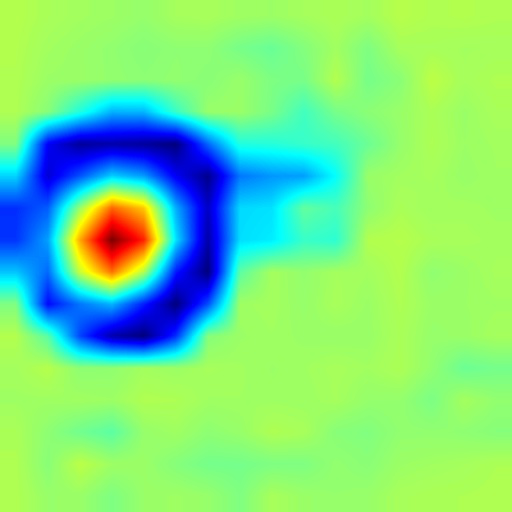

In [465]:
Image.open(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg"))

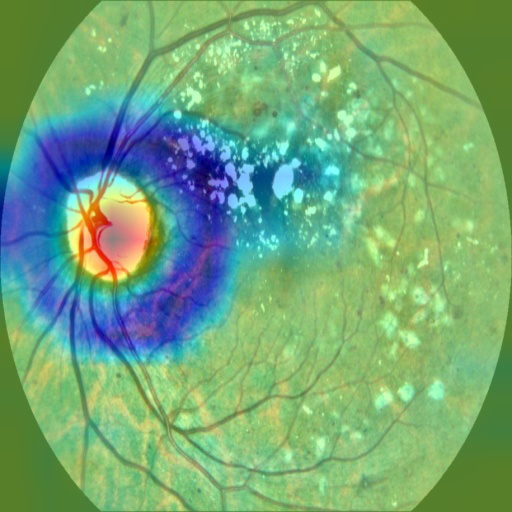

In [466]:
Image.open(os.path.join(saved_loc, "Grad_Result.jpg"))

In [467]:
# ==Guided-Backprop main lines= #
# gb_model => ReLU function in resnet50 change to GuidedBackpropReLU.
gb_model = GuidedBackpropReLUModel(model=resnet_test, use_cuda=False)    # densenet121_test내 ReLU를 GuidedBackpropReLU로 바꾸기
gb_num = gb_model(input_img, target_category = label_index) # 이 모델에 image를 투입하여 얻게 되는 Guided Backpropagation 이미지는 gb_num
gb = deprocess_image(gb_num) # (512, 512, 3), numpy

# Guided Backprop save
cv2.imwrite(os.path.join(saved_loc, "Guided_Backprop.jpg"), gb)

True

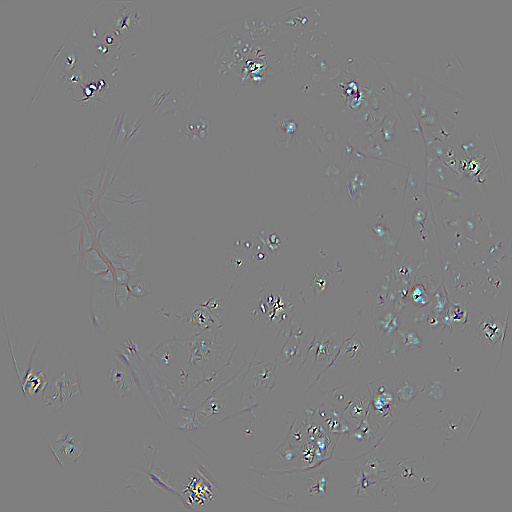

In [468]:
Image.open(os.path.join(saved_loc, "Guided_Backprop.jpg"))

In [469]:
# Guided-Backpropagation * Grad-CAM => Guided Grad-CAM 
# See Fig. 2 in paper.
# grad_cam_map : (1, 1, 512, 512) , torch.Tensor
grayscale_cam = grad_cam_map.squeeze(0).cpu().numpy() # (1, 512, 512), numpy
grayscale_cam = grayscale_cam[0, :] # (224, 224)
cam_mask = cv2.merge([grayscale_cam, grayscale_cam, grayscale_cam]) # (512, 512, 3) 이렇게 합쳐주기

cam_gb = deprocess_image(cam_mask * gb_num) # Guidedbackpropmodel에 img 투입해서 얻은 output인 gb_num과 mask를 곱하기

# Guided Grad-CAM save
cv2.imwrite(os.path.join(saved_loc, "Guided_Grad_CAM.jpg"), cam_gb)

True

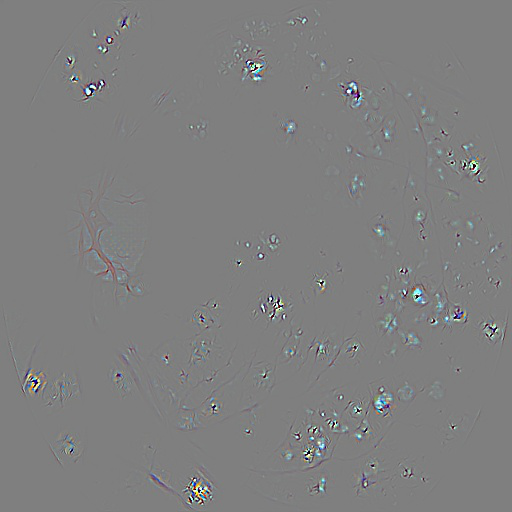

In [470]:
Image.open(os.path.join(saved_loc, "Guided_Grad_CAM.jpg"))

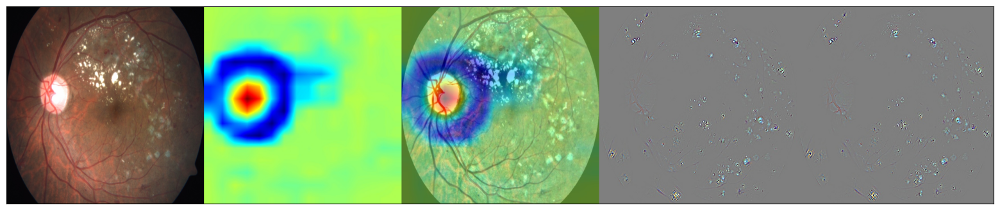

In [471]:
# 그림 만들기
G_heatmap = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg")), cv2.COLOR_BGR2RGB)
G_result = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Grad_Result.jpg")), cv2.COLOR_BGR2RGB)
G_Back = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Guided_Backprop.jpg")), cv2.COLOR_BGR2RGB)
G_CAM = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Guided_Grad_CAM.jpg")), cv2.COLOR_BGR2RGB)

Total = cv2.hconcat([img, G_heatmap, G_result, G_Back, G_CAM])

plt.rcParams["figure.figsize"] = (20, 4)
plt.imshow(Total)
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.savefig(os.path.join(saved_loc, "Final_result.jpg"))
plt.show()

# 왼쪽에서부터 input - Grad-CAM - Grad-CAM - Guide-backprop - Guide-Grad-CAM 순서

### [For Kaggle TPU]

https://beomi.github.io/2020/02/24/Pytorch-with-TPU-on-Colab/

In [ ]:
pip install torch~=2.2.0 torch_xla[tpu]~=2.2.0 -f https://storage.googleapis.com/libtpu-releases/index.html

import torchvision
from torchvision import datasets
import torchvision.transforms as transforms
import torch_xla.distributed.parallel_loader as pl
import math
from torch.optim.lr_scheduler import _LRScheduler


def map_fn(index, flags):
    device = xm.xla_device()
    data_dir = ''
    data_transforms = {
        'train': transforms.Compose([
            transforms.RandomRotation(180),
            transforms.RandomVerticalFlip(p=0.5),
            transforms.RandomChoice([
                transforms.RandomAdjustSharpness(0),
                transforms.RandomAdjustSharpness(1),
                transforms.RandomAdjustSharpness(2),
                transforms.RandomAdjustSharpness(3),
                ]),
            transforms.RandomPosterize(7, p=0.2),
            transforms.RandomResizedCrop(1024, scale=(0.96, 1.0), ratio=(0.95, 1.05)),
            transforms.ToTensor()
        ]),
        'val': transforms.Compose([
            transforms.ToTensor()
            ]),
        'test': transforms.Compose([
            transforms.ToTensor()
            ])
    }

    class DRDataset(Dataset):
        def __init__(self, data_dir, mode, csv, transform=None):
            self.all_data = sorted(glob.glob(os.path.join(data_dir, mode,'*')))
            self.mode = mode
            self.transform = transform
            self.csv = csv
        
        def __getitem__(self, index):
            data_path = self.all_data[index]
            img = Image.open(data_path)
            if self.transform is not None:
                img = self.transform(img)
            img = img.squeeze()
            pt_id = os.path.basename(data_path).split('.')[0]
            label = int(self.csv.loc[pt_id, 'diagnosis'])
            return img, label
        
        def __len__(self):
            length = len(self.all_data)
            return length
        
    train_csv = pd.read_csv(os.path.join(data_dir,'train_label.csv'), index_col=0)
    val_csv = pd.read_csv(os.path.join(data_dir,'val_label.csv'), index_col=0)
    
    train_data = DRDataset(data_dir=data_dir, mode='train', csv=train_csv, transform=data_transforms['train'])
    val_data = DRDataset(data_dir=data_dir, mode='val', csv=val_csv, transform=data_transforms['val'])
    
    train_loader = DataLoader(train_data, batch_size=flags['batch_size'], shuffle=True, drop_last=False, num_workers=flags['num_workers'])  # num_worker로 Multi Process Data Loading 구현
    val_loader = DataLoader(val_data, batch_size=flags['batch_size'], shuffle=False, drop_last=False, num_workers=flags['num_workers']) # Kaggle CPU = 2 core
    
    class TransferResNet512(nn.Module):
        def __init__ (self, num_classes):
            super(TransferResNet512, self).__init__()
            self.ResNet50 = torchvision.models.resnet50(pretrained=True)
            self.ResNet50.avgpool = nn.MaxPool2d(2)
            self.ResNet50.fc = nn.Linear(2048*8*8, num_classes)
        
        def forward(self,x):
            x = self.ResNet50(x)
            return x

    resnet50_transfer = TransferResNet512(num_classes=5).to(device) 

    # Layer 3, 4의 required_grad True로 바꾸기 (Layer 3의 시작: 73) -> 73 이전은 false, 이후는 True
    count = 0
    for param in resnet50_transfer.ResNet50.parameters():
        count += 1
        if count >= 73:
            param.requires_grad = True
        else:
            param.requires_grad = False
    
    # Layer 3, 4의 Conv layer를 다시 initialization
    for name, layer in resnet50_transfer.ResNet50.named_children():
        if name == 'layer2':
            bottleneck_index = 0
            conv_index = 1
            for name, param in resnet50_transfer.ResNet50.named_parameters():
                # Layer 3의 Conv layer parameter initialization
                if name == 'layer2.'+str(bottleneck_index)+'.conv'+str(conv_index)+'.weight':
                    nn.init.xavier_uniform_(param)
                    conv_index += 1
                    if name == 'layer2.'+str(bottleneck_index)+'.conv3.weight':
                        bottleneck_index += 1
                        conv_index = 1
        elif name == 'layer3':
            bottleneck_index = 0
            conv_index = 1
            for name, param in resnet50_transfer.ResNet50.named_parameters():
                # Layer 3의 Conv layer parameter initialization
                if name == 'layer3.'+str(bottleneck_index)+'.conv'+str(conv_index)+'.weight':
                    nn.init.xavier_uniform_(param)
                    conv_index += 1
                    if name == 'layer3.'+str(bottleneck_index)+'.conv3.weight':
                        bottleneck_index += 1
                        conv_index = 1    
        elif name == 'layer4':
            bottleneck_index = 0
            conv_index = 1
            for name, param in resnet50_transfer.ResNet50.named_parameters():
                # Layer 4의 Conv layer parameter initialization
                if name == 'layer4.'+str(bottleneck_index)+'.conv'+str(conv_index)+'.weight':
                    nn.init.xavier_uniform_(param)
                    conv_index += 1
                    if name == 'layer4.'+str(bottleneck_index)+'.conv3.weight':
                        bottleneck_index += 1
                        conv_index = 1
    # Layer 3, 4의 batch normalization gamma, beta initialization
    # 전부 initialization시키므로 처음 시작을 0, 1로 시작, 만약 좀 더 뒤로 바꾸고 싶으면 초기 시작 값을 바꾸기
    bottleneck_index = 0
    bn_index = 1
    for name, param in resnet50_transfer.ResNet50.named_parameters():          
        if name == 'layer2.'+str(bottleneck_index)+'.'+'bn1.weight':
            nn.init.ones_(param)
        elif name == 'layer2.'+str(bottleneck_index)+'.'+'bn2.weight':
            nn.init.ones_(param)
        elif name == 'layer2.'+str(bottleneck_index)+'.'+'bn3.weight':
            nn.init.zeros_(param)
        elif name == 'layer2.'+str(bottleneck_index)+'.'+'bn'+str(bn_index)+'.bias':
            nn.init.zeros_(param)
            bn_index += 1
            if bn_index == 4:
                bn_index=1
                bottleneck_index += 1
    bottleneck_index = 0
    bn_index = 1
    for name, param in resnet50_transfer.ResNet50.named_parameters():          
        if name == 'layer3.'+str(bottleneck_index)+'.'+'bn1.weight':
            nn.init.ones_(param)
        elif name == 'layer3.'+str(bottleneck_index)+'.'+'bn2.weight':
            nn.init.ones_(param)
        elif name == 'layer3.'+str(bottleneck_index)+'.'+'bn3.weight':
            nn.init.zeros_(param)
        elif name == 'layer3.'+str(bottleneck_index)+'.'+'bn'+str(bn_index)+'.bias':
            nn.init.zeros_(param)
            bn_index += 1
            if bn_index == 4:
                bn_index=1
                bottleneck_index += 1
    bottleneck_index = 0
    bn_index = 1
    for name, param in resnet50_transfer.ResNet50.named_parameters():          
        if name == 'layer4.'+str(bottleneck_index)+'.'+'bn1.weight':
            nn.init.ones_(param)
        elif name == 'layer4.'+str(bottleneck_index)+'.'+'bn2.weight':
            nn.init.ones_(param)
        elif name == 'layer4.'+str(bottleneck_index)+'.'+'bn3.weight':
            nn.init.zeros_(param)
        elif name == 'layer4.'+str(bottleneck_index)+'.'+'bn'+str(bn_index)+'.bias':
            nn.init.zeros_(param)
            bn_index += 1
            if bn_index == 4:
                bn_index=1
                bottleneck_index += 1
        
    def save_model(model, epoch, optimizer, epoch_loss, val_accuracy, saved_dir):
        os.makedirs(saved_dir, exist_ok=True)
        check_point = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': epoch_loss
        }
        val_accuracy = round(val_accuracy,1)
        file_name = str(f"ckpoint_{epoch+1}_{val_accuracy}%.pt")
        output_path = os.path.join(saved_dir, file_name)
        torch.save(check_point,output_path)
    
    def train(num_epochs, model, data_loader, criterion, optimizer, scheduler, val_every, device, saved_dir, writer):
        print('Start training..')
        best_loss = 9999999
        best_epoch = 0
        count = 0
        for epoch in tqdm(range(num_epochs), desc='epoch'):
            torch.cuda.empty_cache()
            # running_loss = 0.0
            for i, (imgs, labels) in tqdm(enumerate(data_loader), desc="in epoch"):
                imgs, labels = imgs.to(device), labels.to(device)
                outputs = model(imgs)
                loss = criterion(outputs, labels)

                optimizer.zero_grad()
                loss.backward()
                #optimizer.step()
                xm.optimizer_step(optimizer, barrier=True) # TPU인 경우 사용

                _, argmax = torch.max(outputs, 1)
                accuracy = (labels == argmax).float().mean()

                if (i+1) % 30 == 0:
                    print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}, Accuracy: {:.2f}%'.format(
                        epoch+1, num_epochs, i+1, len(data_loader), loss.item(), accuracy.item() * 100))
                if (i+1) % 50 == 0:
                    writer.add_scalar('Loss/Train', loss, i)
                    writer.add_scalar('Accuracy/Train', accuracy, i)
                #if i % 30 == 29:
                    #loss_tracker(loss_plt, torch.Tensor([running_loss/30]), torch.Tensor([i + epoch*len(trainloader) ]))
                    #running_loss = 0.0
            if (epoch + 1) % val_every == 0:
                avrg_loss, val_accuracy = validation(epoch + 1, model, val_loader, criterion, device)
                # Saving validation loss and accuracy
                writer.add_scalar('Loss/Validation', avrg_loss, epoch+1)
                writer.add_scalar('Accuracy/Validation', val_accuracy, epoch+1)
                if avrg_loss < best_loss:
                    print(f'Best performance at epoch: {epoch + 1}')
                    best_loss = float(avrg_loss)
                    if val_accuracy >= 60:
                        save_model(model, epoch, optimizer, avrg_loss, val_accuracy, saved_dir)
                        print('Save model in', saved_dir)
                    else:
                        print('The model is not saved because the accuracy does not exceed 70%.')
                    count = 0
                    best_epoch = epoch + 1
                else:
                    count += 1
                    print(f'Best epoch does not appear / Previous best epoch:{best_epoch}, best loss: {best_loss}')
                    print(f'A number of epochs remain until early stop: {20-count}')
                    if count >= 20:
                        print('Best performance does not occur within 20 epochs. Early stopping!!')
                        scheduler.step()
                        writer.flush()
                        return
                ''' Only for local setting
                loss_tracker(loss_plt, torch.Tensor([avrg_loss]), torch.Tensor([epoch]))'''
            scheduler.step()
        writer.flush()
    
    def validation(epoch, model, data_loader, criterion, device):
        print('Start validation #{}'.format(epoch) )
        model.eval()
        with torch.no_grad():
            total = 0
            correct = 0
            total_loss = 0
            cnt = 0
            torch.cuda.empty_cache()
            for i, (imgs, labels) in enumerate(data_loader):
                imgs, labels = imgs.to(device), labels.to(device)

                outputs = model(imgs)
                loss = criterion(outputs,labels)
                
                total += imgs.size(0)
                _, argmax = torch.max(outputs, 1)
                correct += (labels == argmax).sum().item()
                total_loss += loss
                cnt += 1
            avrg_loss = total_loss / cnt
            val_accuracy = correct / total * 100
            print('Validation #{}  Accuracy: {:.2f}%  Average Loss: {:.4f}'.format(epoch, val_accuracy, avrg_loss))
        model.train()
        return float(avrg_loss), float(val_accuracy)

    class CosineAnnealingWarmUpRestarts(_LRScheduler):
        """
            optimizer (Optimizer): Wrapped optimizer.
            first_cycle_steps (int): First cycle step size.
            cycle_mult(float): Cycle steps magnification. Default: -1.
            max_lr(float): First cycle's max learning rate. Default: 0.1.
            min_lr(float): Min learning rate. Default: 0.001.
            warmup_steps(int): Linear warmup step size. Default: 0.
            gamma(float): Decrease rate of max learning rate by cycle. Default: 1.
            last_epoch (int): The index of last epoch. Default: -1.
        """

        def __init__(self, optimizer, first_cycle_steps, cycle_mult = 1.0, max_lr = 0.1, min_lr = 0.001, warmup_steps = 0, gamma = 1.0, last_epoch = -1):
            # first_cycle_steps은 최초 주기, cycle_mult 다음 주기가 몇 배 늘어나는지
            # max_lr는 LR이 얼마까지 높아지는지, gamma는 주기 반복 시 max_lr에 곱해지는 값 (LR max를 줄이는 역할)
            # warmup_steps은 Warm up 시 필요한 epoch 수를 지정 (일반적으로 짧은 epoch 수를 지정)
            self.first_cycle_steps = first_cycle_steps
            self.cycle_mult = cycle_mult
            self.base_max_lr = max_lr                       # first max learning rate
            self.max_lr = max_lr                            # max learning rate in the current cycle
            self.min_lr = min_lr                            # min learning rate
            self.warmup_steps = warmup_steps                # warmup step size
            self.gamma = gamma                              # decrease rate of max learning rate by cycle
            
            self.cur_cycle_steps = first_cycle_steps        # first cycle step size
            self.cycle = 0                                  # cycle count
            self.step_in_cycle = last_epoch                 # step size of the current cycle

            super(CosineAnnealingWarmUpRestarts, self).__init__(optimizer, last_epoch)
            
            # set learning rate min_lr
            self.init_lr()
        
        def init_lr(self):
            self.base_lrs = []
            for param_group in self.optimizer.param_groups:
                param_group['lr'] = self.min_lr
                self.base_lrs.append(self.min_lr)
            # parameter에 저장된 LR을 처음 LR로 저장
        
        def get_lr(self):
            if self.step_in_cycle == -1:                    # 첫 시작일 때
                return self.base_lrs                        # 그냥 base LR을 반영
            elif self.step_in_cycle < self.warmup_steps:    # 현재 epoch이 warmup_steps (warm up 단계) 안일 때
                return [(self.max_lr - base_lr)*self.step_in_cycle / self.warmup_steps + base_lr for base_lr in self.base_lrs]
                # 첫 시작 LR~최대 LR까지 선형으로 증가시키기
            else:                                           # warm up 단계 이후일 때
                return [base_lr + (self.max_lr - base_lr) * (1 + math.cos(math.pi * (self.step_in_cycle-self.warmup_steps) / (self.cur_cycle_steps - self.warmup_steps))) / 2
                        for base_lr in self.base_lrs]
                #cosine annealing을 적용

        def step(self, epoch=None):
            if epoch is None:
                epoch = self.last_epoch + 1
                self.step_in_cycle = self.step_in_cycle + 1
                if self.step_in_cycle >= self.cur_cycle_steps:
                    self.cycle += 1
                    self.step_in_cycle = self.step_in_cycle - self.cur_cycle_steps
                    self.cur_cycle_steps = int((self.cur_cycle_steps - self.warmup_steps) * self.cycle_mult) + self.warmup_steps
            else:
                if epoch >= self.first_cycle_steps:
                    if self.cycle_mult == 1.:
                        self.step_in_cycle = epoch % self.first_cycle_steps
                        self.cycle = epoch // self.first_cycle_steps
                    else:
                        n = int(math.log((epoch / self.first_cycle_steps * (self.cycle_mult - 1) + 1), self.cycle_mult))
                        self.cycle = n
                        self.step_in_cycle = epoch - int(self.first_cycle_steps * (self.cycle_mult ** n - 1) / (self.cycle_mult - 1))
                        self.cur_cycle_steps = self.first_cycle_steps * self.cycle_mult ** (n)
                else:
                    self.cur_cycle_steps = self.first_cycle_steps
                    self.step_in_cycle = epoch
                    
            self.max_lr = self.base_max_lr * (self.gamma**self.cycle)
            self.last_epoch = math.floor(epoch)
            for param_group, lr in zip(self.optimizer.param_groups, self.get_lr()):
                param_group['lr'] = lr
    
    # Case 2: Cosine Annealing with warm up start 사용
    flags['seed']

    criterion = nn.CrossEntropyLoss().to(device)
    optimizer = torch.optim.AdamW(resnet50_transfer.parameters(), lr=0.00001)
    scheduler = CosineAnnealingWarmUpRestarts(optimizer, first_cycle_steps=10, cycle_mult = 1.0, max_lr = 0.01, min_lr = 0.00001, warmup_steps = 2, gamma = 1.0, last_epoch = -1)

    val_every = 1
    saved_dir = './saved'

    train(flags['num_epochs'], resnet50_transfer, train_loader, criterion, optimizer, scheduler, val_every, device, saved_dir, writer)

flags = {}
flags['batch_size'] = 32
flags['num_workers'] = 8
flags['num_epochs'] = 50
flags['seed'] = 7777

xmp.spawn(map_fn, args=(flags,), nprocs=8, start_method='fork')